# Cargando librerias

In [1]:
from pycocotools import mask as cocomask
import cv2
import matplotlib.pyplot as plt
import json
import numpy as np
import pandas as pd
import copy
import logging
import colorsys
import random
from random import randint, random as rand
import shutil
from pathlib import Path
import os


import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.utils import plot_model
from tensorflow.keras import Sequential
from tensorflow.keras.layers import (Conv2D, Input, RandomFlip, RandomRotation, 
                                    Reshape, BatchNormalization, Dropout, Dense, 
                                    MaxPooling2D, GlobalAveragePooling2D, RandomBrightness, 
                                    RandomContrast, GaussianNoise, SpatialDropout2D)

from tensorflow.keras.applications.resnet import ResNet50, preprocess_input
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.optimizers import AdamW, Adam
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping
from tensorflow.keras.initializers import RandomNormal, Zeros
import tensorflow.keras.backend as K
from tensorflow.keras.models import Model

/tmp/ipykernel_1534434/2461397558.py:6: DeprecationWarning: 

Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),

(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)

but was not found to be installed on your system.

If this would cause problems for you,

please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466

        

  import pandas as pd

2024-03-01 23:29:36.682866: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.

2024-03-01 23:29:37.184903: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered

202

In [2]:
src_path = "/kaggle/input/coco-2017-dataset/coco2017/"
dst_path = "/kaggle/working/"
w_disp, h_disp = 6, 5
transformar_json2csv = False
create_tensorflor_record = False

In [3]:
def rle_to_coco(annotation: dict) -> list[dict]:
    annotation["segmentation"] = json.loads(annotation["segmentation"].replace("'", "\""))
    annotation["segmentation"] = cocomask.frPyObjects(
        annotation["segmentation"],
        annotation["segmentation"]["size"][0],
        annotation["segmentation"]["size"][1],
    )

    maskedArr = cocomask.decode(annotation["segmentation"])
    contours, _ = cv2.findContours(maskedArr, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    segmentation = []

    for contour in contours:
        if contour.size >= 6:
            segmentation.append(contour)

    if len(segmentation) == 0:
        logging.debug(
            f"Annotation with id {annotation['id']} is not valid, it has no segmentations."
        )
        annotations = []

    else:
        annotations = list()
        for i, seg in enumerate(segmentation):

            single_annotation = copy.deepcopy(annotation)
            single_annotation["segmentation"] = [
                seg.astype(float).flatten().tolist()
            ]
            single_annotation["bbox"] = list(cv2.boundingRect(seg))
            single_annotation["area"] = cv2.contourArea(seg)
            #single_annotation["instance_id"] = annotation["id"]
            #single_annotation["annotation_id"] = f"{annotation['id']}_{i}"

            annotations.append(single_annotation)

    return annotations

# Trabajando sobre el set de datos
## Transformamos archivos JSON a CSV

In [4]:
def transform_rle_to_polygon(data):
    data_annot_rle = data[data.iscrowd == 1].copy()
    cantidad_registros = len(data_annot_rle)

    registros_transformados = pd.DataFrame(columns=["segmentation", "area", "iscrowd", "image_id", "bbox", "category_id", "id"])

    for i in range(cantidad_registros):
        registro = data_annot_rle.iloc[i].copy()
        list_objects = rle_to_coco(registro)
        for one_object in list_objects:
            registros_transformados = pd.concat([registros_transformados, one_object.to_frame().T], axis=0)
    
    index = data_annot_rle.index
    data_annot = pd.concat([data.drop(index, axis=0), registros_transformados], axis=0, ignore_index=True)
    return data_annot

In [5]:
if transformar_json2csv == True:
    for type_set in ["val", "train"]:
        with open(src_path+"annotations/instances_"+type_set+"2017.json") as f:
            instances = json.load(f)
            pd.json_normalize(instances, record_path="images", max_level=0).to_csv(dst_path+type_set+"_images.csv", index=False)
            pd.json_normalize(instances, record_path="annotations", max_level=0).to_csv(dst_path+type_set+"_annotations.csv", index=False)
            pd.json_normalize(instances, record_path="categories", max_level=0).to_csv(dst_path+type_set+"_categories.csv", index=False)
            
    val_dir_images = pd.read_csv(dst_path+"val_images.csv")
    val_annot = pd.read_csv(dst_path+"val_annotations.csv")
    val_cat = pd.read_csv(dst_path+"val_categories.csv")
    
    train_dir_images = pd.read_csv(dst_path+"train_images.csv")
    train_annot = pd.read_csv(dst_path+"train_annotations.csv")
    train_cat = pd.read_csv(dst_path+"train_categories.csv")
    
    train_annot = transform_rle_to_polygon(train_annot)
    val_annot = transform_rle_to_polygon(val_annot)
    
    train_annot.to_csv(dst_path+"train_annotations.csv", index=False)
    val_annot.to_csv(dst_path+"val_annotations.csv", index=False)
    
else:
    val_dir_images = pd.read_csv(dst_path+"val_images.csv")
    val_annot = pd.read_csv(dst_path+"val_annotations.csv")
    val_cat = pd.read_csv(dst_path+"val_categories.csv")
    
    train_dir_images = pd.read_csv(dst_path+"train_images.csv")
    train_annot = pd.read_csv(dst_path+"train_annotations.csv")
    train_cat = pd.read_csv(dst_path+"train_categories.csv")

In [6]:
train_dir_images.head()

,license,file_name,coco_url,height,width,date_captured,flickr_url,id
0,3,000000391895.jpg,http://images.cocodataset.org/train2017/000000...,360,640,2013-11-14 11:18:45,http://farm9.staticflickr.com/8186/8119368305_...,391895
1,4,000000522418.jpg,http://images.cocodataset.org/train2017/000000...,480,640,2013-11-14 11:38:44,http://farm1.staticflickr.com/1/127244861_ab0c...,522418
2,3,000000184613.jpg,http://images.cocodataset.org/train2017/000000...,336,500,2013-11-14 12:36:29,http://farm3.staticflickr.com/2169/2118578392_...,184613
3,3,000000318219.jpg,http://images.cocodataset.org/train2017/000000...,640,556,2013-11-14 13:02:53,http://farm5.staticflickr.com/4125/5094763076_...,318219
4,3,000000554625.jpg,http://images.cocodataset.org/train2017/000000...,640,426,2013-11-14 16:03:19,http://farm5.staticflickr.com/4086/5094162993_...,554625


In [7]:
train_annot.head()

,segmentation,area,iscrowd,image_id,bbox,category_id,id
0,"[[239.97, 260.24, 222.04, 270.49, 199.84, 253....",2765.14865,0,558840,"[199.84, 200.46, 77.71, 70.88]",58,156
1,"[[247.71, 354.7, 253.49, 346.99, 276.63, 337.3...",1545.42130,0,200365,"[234.22, 317.11, 149.39, 38.55]",58,509
2,"[[274.58, 405.68, 298.32, 405.68, 302.45, 402....",5607.66135,0,200365,"[239.48, 347.87, 160.0, 57.81]",58,603
3,"[[296.65, 388.33, 296.65, 388.33, 297.68, 388....",0.00000,0,200365,"[296.65, 388.33, 1.03, 0.0]",58,918
4,"[[251.87, 356.13, 260.13, 343.74, 300.39, 335....",800.41325,0,200365,"[251.87, 333.42, 125.94, 22.71]",58,1072


In [8]:
train_cat.head()

,supercategory,id,name
0,person,1,person
1,vehicle,2,bicycle
2,vehicle,3,car
3,vehicle,4,motorcycle
4,vehicle,5,airplane


## Mergeando set de datos

In [9]:
train = pd.merge(train_dir_images, train_annot, how="inner", left_on='id', right_on='image_id')
train = pd.merge(train, train_cat, how="inner", left_on='category_id', right_on='id')
train.drop(["id_x", "id"], axis=1, inplace=True)
train.rename(columns={
    "id_y": "object_id",
    "name": "category_name"
}, inplace=True)
train[["image_id", "category_id"]] = train[["image_id", "category_id"]].astype(int)
train.head()

,license,file_name,coco_url,height,width,date_captured,flickr_url,segmentation,area,iscrowd,image_id,bbox,category_id,object_id,supercategory,category_name
0,3,000000391895.jpg,http://images.cocodataset.org/train2017/000000...,360,640,2013-11-14 11:18:45,http://farm9.staticflickr.com/8186/8119368305_...,"[[376.97, 176.91, 398.81, 176.91, 396.38, 147....",12190.44565,0,391895,"[359.17, 146.17, 112.45, 213.57]",4,151091,vehicle,motorcycle
1,3,000000391895.jpg,http://images.cocodataset.org/train2017/000000...,360,640,2013-11-14 11:18:45,http://farm9.staticflickr.com/8186/8119368305_...,"[[352.55, 146.82, 353.61, 137.66, 356.07, 112....",14107.27130,0,391895,"[339.88, 22.16, 153.88, 300.73]",1,202758,person,person
2,3,000000391895.jpg,http://images.cocodataset.org/train2017/000000...,360,640,2013-11-14 11:18:45,http://farm9.staticflickr.com/8186/8119368305_...,"[[477.41, 217.71, 475.06, 212.15, 473.78, 208....",708.26055,0,391895,"[471.64, 172.82, 35.92, 48.1]",1,1260346,person,person
3,3,000000391895.jpg,http://images.cocodataset.org/train2017/000000...,360,640,2013-11-14 11:18:45,http://farm9.staticflickr.com/8186/8119368305_...,"[[486.01, 217.92, 486.01, 211.11, 487.71, 206....",626.98525,0,391895,"[486.01, 183.31, 30.63, 34.98]",2,1766676,vehicle,bicycle
4,4,000000522418.jpg,http://images.cocodataset.org/train2017/000000...,480,640,2013-11-14 11:38:44,http://farm1.staticflickr.com/1/127244861_ab0c...,"[[426.91, 58.24, 434.49, 77.74, 467.0, 80.99, ...",63325.42190,0,522418,"[382.48, 0.0, 256.8, 474.31]",1,455475,person,person


In [10]:
val = pd.merge(val_dir_images, val_annot, how="inner", left_on='id', right_on='image_id')
val = pd.merge(val, val_cat, how="inner", left_on='category_id', right_on='id')
val.drop(["id_x", "id"], axis=1, inplace=True)
val.rename(columns={
    "id_y": "object_id",
    "name": "category_name"
}, inplace=True)
val[["image_id", "category_id"]] = val[["image_id", "category_id"]].astype(int)
val.head()

,license,file_name,coco_url,height,width,date_captured,flickr_url,segmentation,area,iscrowd,image_id,bbox,category_id,object_id,supercategory,category_name
0,4,000000397133.jpg,http://images.cocodataset.org/val2017/00000039...,427,640,2013-11-14 17:02:52,http://farm7.staticflickr.com/6116/6255196340_...,"[[224.24, 297.18, 228.29, 297.18, 234.91, 298....",1481.38065,0,397133,"[217.62, 240.54, 38.99, 57.75]",44,82445,kitchen,bottle
1,4,000000397133.jpg,http://images.cocodataset.org/val2017/00000039...,427,640,2013-11-14 17:02:52,http://farm7.staticflickr.com/6116/6255196340_...,"[[292.37, 425.1, 340.6, 373.86, 347.63, 256.31...",54085.62170,0,397133,"[1.0, 240.24, 346.63, 186.76]",67,119568,furniture,dining table
2,4,000000397133.jpg,http://images.cocodataset.org/val2017/00000039...,427,640,2013-11-14 17:02:52,http://farm7.staticflickr.com/6116/6255196340_...,"[[446.71, 70.66, 466.07, 72.89, 471.28, 78.85,...",17376.91885,0,397133,"[388.66, 69.92, 109.41, 277.62]",1,200887,person,person
3,4,000000397133.jpg,http://images.cocodataset.org/val2017/00000039...,427,640,2013-11-14 17:02:52,http://farm7.staticflickr.com/6116/6255196340_...,"[[136.18, 253.44, 153.89, 277.3, 157.89, 278.2...",123.19340,0,397133,"[135.57, 249.43, 22.32, 28.79]",49,693231,kitchen,knife
4,4,000000397133.jpg,http://images.cocodataset.org/val2017/00000039...,427,640,2013-11-14 17:02:52,http://farm7.staticflickr.com/6116/6255196340_...,"[[37.61, 381.77, 31.28, 360.25, 40.15, 352.65,...",2136.46615,0,397133,"[31.28, 344.0, 68.12, 40.83]",51,713388,kitchen,bowl


## Objetivos

In [11]:
def get_data_target(df, targets):
    df_target = df[df.category_name.isin(targets)].copy()
    #df_target.category_id = df_target.category_name.map(get_class_ids())
    df_target['segmentation'] = df_target['segmentation'].apply(lambda x: np.fromstring(str(x).replace('[', '').replace(']','').replace('\n', ''), dtype=float, sep=',').reshape(-1,1,2))
    df_target['bbox'] = df_target['bbox'].apply(lambda x: np.fromstring(str(x).replace('[', '').replace(']','').replace('\n', ''), dtype=float, sep=','))
    df_target['bbox'] = df_target['bbox'].apply(lambda x: np.array([x[0], x[1], x[0] + x[2], x[1] + x[3]]))
    
    df_target = df_target.groupby(["file_name"]).agg({"bbox": lambda x: list(x), "segmentation": lambda x: x, "category_id": lambda x: list(x), "category_name": lambda x: list(x)}).reset_index().copy()
    
    df_target['bbox'] = df_target['bbox'].apply(lambda x: np.array(x))
    df_target['category_id'] = df_target['category_id'].apply(lambda x: np.array(x))
    df_target['segmentation'] = df_target['segmentation'].apply(lambda x: np.array(x))
    
    return df_target

targets = ['banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake']

train_target = get_data_target(train, targets)
val_target = get_data_target(val, targets)

train_target.head()

/tmp/ipykernel_1534434/1707501084.py:4: DeprecationWarning: string or file could not be read to its end due to unmatched data; this will raise a ValueError in the future.

  df_target['segmentation'] = df_target['segmentation'].apply(lambda x: np.fromstring(str(x).replace('[', '').replace(']','').replace('\n', ''), dtype=float, sep=',').reshape(-1,1,2))


,file_name,bbox,segmentation,category_id,category_name
0,000000000009.jpg,"[[249.6, 229.27, 565.84, 474.35], [376.2, 40.3...","[[[[249.6 348.99]], [[267.67 311.72]], [[291....","[56, 55, 55, 55, 55]","[broccoli, orange, orange, orange, orange]"
1,000000000092.jpg,"[[125.7, 0.96, 501.84, 293.62]]","[[[483.61, 153.53]], [[409.73, 208.22]], [[355...",[61],[cake]
2,000000000110.jpg,"[[136.66, 391.91, 474.35, 474.35]]","[[[136.66, 473.22]], [[167.15, 429.18]], [[227...",[59],[pizza]
3,000000000113.jpg,"[[142.38, 424.27, 402.7, 573.8399999999999]]","[[[176.9, 506.25]], [[152.45, 481.8]], [[142.3...",[61],[cake]
4,000000000127.jpg,"[[179.15, 263.57, 305.1, 404.72]]","[[[272.53, 402.55]], [[266.02, 384.09]], [[292...",[61],[cake]


In [12]:
val_target.head()

,file_name,bbox,segmentation,category_id,category_name
0,000000001425.jpg,"[[64.29, 184.96, 440.83000000000004, 403.08000...","[[[95.28, 377.82]], [[64.29, 296.31]], [[183.6...",[54],[sandwich]
1,000000002149.jpg,"[[96.45, 94.44, 339.59, 325.52]]","[[[100.47, 237.11]], [[96.45, 227.06]], [[98.4...",[53],[apple]
2,000000002157.jpg,"[[16.31, 173.52, 269.63, 366.39]]","[[[17.27, 216.7]], [[36.46, 197.51]], [[103.63...",[61],[cake]
3,000000002587.jpg,"[[52.24, 0.76, 450.38, 357.74], [172.3, 10.98,...","[[[[354.96 254.81]], [[384.45 247.87]], [[402....","[52, 60]","[banana, donut]"
4,000000003501.jpg,"[[125.28, 67.68, 263.52, 223.20000000000002], ...","[[[[184.32 214.56]], [[148.32 184.32]], [[128....","[56, 56]","[broccoli, broccoli]"


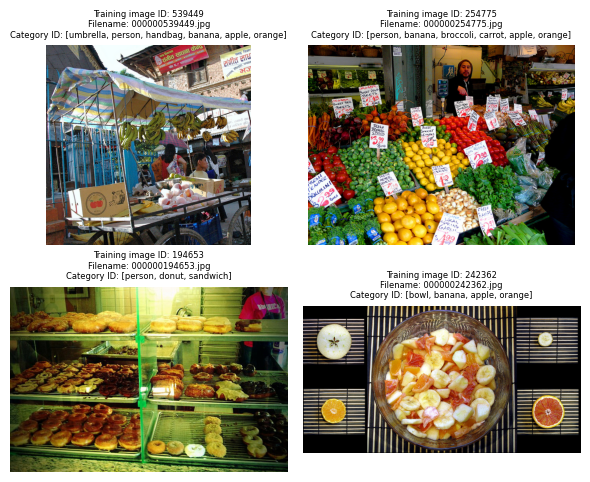

In [13]:
def show_targets(data, type_set="train", targets=[]):
    fig, axs = plt.subplots(2, 2, figsize=(w_disp, h_disp))
    
    for i, target in enumerate(targets[:4]):
        target_images = data[data.category_name == target].copy()
        value = randint(0, len(target_images)-1)
        target_image = target_images.iloc[value]
        category_id = data.loc[data["image_id"] == target_image.image_id, "category_name"].unique().tolist()
        
        img = cv2.imread(src_path+type_set+"2017/"+target_image.file_name)
        
        plt.subplot(2, 2, i+1)
        plt.imshow(img[...,::-1]); # BGR -> RGB
        plt.title(f"Training image ID: {target_image.image_id}\nFilename: {target_image.file_name}\nCategory ID: {category_id if len(category_id) <= 6 else category_id[0:5]+['...']}".replace("'", ""), fontsize=6)
        plt.axis("off")
    
    plt.tight_layout()
    return

show_targets(train, targets=targets)

## Bounding boxes

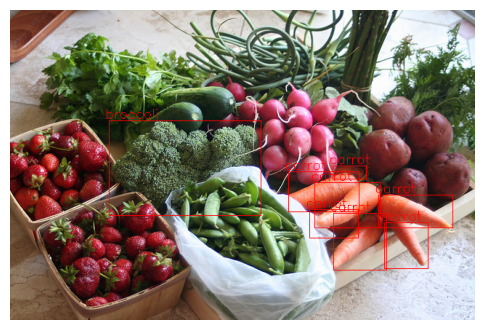

In [14]:
def add_bbox(img, bbox, category_name, fontScale=0.6):
    bbox = bbox.astype(int)
    img = cv2.rectangle(img, (bbox[0], bbox[1]), (bbox[2], bbox[3]), (0, 0, 255), 1)
    img = cv2.putText(img, category_name, (bbox[0]-5, bbox[1]-3), 0, fontScale, (0, 0, 255), 1)
    return img

def show_bbox(file, img=None, dataset="train"):
    if img is None:
        img = cv2.imread(src_path+dataset+"2017/"+file.file_name)
    
    plt.figure(figsize=(w_disp, h_disp))
    plt.axis("off")
    for bbox, category_name in zip(file.bbox, file.category_name):
        add_bbox(img, bbox, category_name)
    return img

file = train_target.iloc[1090]
img = show_bbox(file)
plt.imshow(img[...,::-1]); # BGR -> RGB

## Segmentations

<Figure size 1000x1000 with 0 Axes>

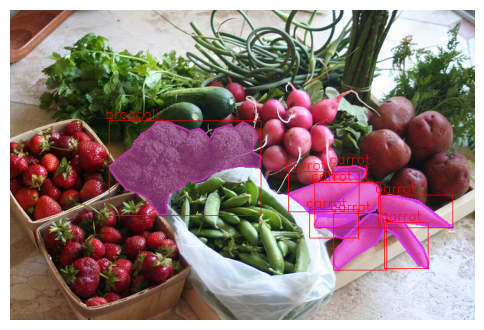

In [15]:
def get_random_color():
    h,s,l = rand(), 0.5 + rand()/2.0, 0.4 + rand()/5.0
    return [int(256*i) for i in colorsys.hls_to_rgb(h,l,s)]

def draw_mask(file, alpha, dataset="train"):
    categories_name = list(set(file.category_name))
    colorXcategory = pd.DataFrame(data={"color":[get_random_color() for _ in range(len(categories_name))]}, index=categories_name)
    img = cv2.imread(src_path+dataset+"2017/"+file.file_name)
    masked_image = img.copy()
    
    plt.figure(figsize=(10, 10))
    for category_name, segmentation in zip(file.category_name, file.segmentation):
        color = colorXcategory.loc[category_name, "color"]
        points = segmentation.astype(int)
        cv2.fillPoly(masked_image, [points], color=color)
        
    img = cv2.addWeighted(masked_image, alpha, img, 1 - alpha, 0) 
    
    for category_name, segmentation in zip(file.category_name, file.segmentation):
        color = colorXcategory.loc[category_name, "color"]
        points = segmentation.astype(int)
        img = cv2.polylines(img, [points], True, color=color, thickness=2)
    return img

file = train_target.iloc[1090]
img = draw_mask(file, 0.6)
img = show_bbox(file, img)
plt.imshow(img[...,::-1]); #BGR -> RGB

## Creacion del datasets de imagenes

In [16]:
seed = 42
tf.random.set_seed(seed)
np.random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
random.seed(seed)

autotune = tf.data.AUTOTUNE

In [17]:
def image_to_tensor(path):
    return tf.convert_to_tensor(cv2.imread(path)/255)

def _bytes_feature(value):
    if isinstance(value, type(tf.constant(0))):
        value = value.numpy()
    return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

def createTFRecord(set_="train"):
    examples = []
    
    if set_ == "train":
        dataset = train_target
    elif set_ == "val":
        dataset = val_target
    
    for index, row in dataset.iterrows():
        with open(src_path+set_+"2017/"+row.file_name,'rb') as f:
            image_data=f.read()

        example = tf.train.Example(features=tf.train.Features(feature={
            'image': tf.train.Feature(bytes_list=tf.train.BytesList(value=[image_data])),
            'file_name': tf.train.Feature(bytes_list=tf.train.BytesList(value=[tf.compat.as_bytes(row.file_name)])),
            'category_ids': tf.train.Feature(int64_list=tf.train.Int64List(value=row.category_id)),
            'bboxes': _bytes_feature(tf.io.serialize_tensor(row.bbox)),
        }))
        examples.append(example)
        
    with tf.io.TFRecordWriter(dst_path+"coco_"+set_+".tfrecord") as writer:
        for j in examples:
            writer.write(j.SerializeToString())
    examples.clear()
    return 

def parse(feature):
    features = tf.io.parse_single_example(
        feature,
        features={
        'image': tf.io.FixedLenFeature([], tf.string),
        'file_name': tf.io.FixedLenFeature([], tf.string),
        'category_ids': tf.io.VarLenFeature(tf.int64),
        'bboxes': tf.io.FixedLenFeature([], tf.string)
        
    })
    return tf.image.decode_jpeg(features['image'], channels=3), tf.io.parse_tensor(features['bboxes'], out_type=tf.float64), tf.sparse.to_dense(features["category_ids"]) 

if create_tensorflor_record == True:
    createTFRecord("train")
    createTFRecord("val")

train_dataset = tf.data.TFRecordDataset(dst_path+"coco_train.tfrecord")
train_dataset = train_dataset.map(parse, num_parallel_calls=autotune)

val_dataset = tf.data.TFRecordDataset(dst_path+"coco_val.tfrecord")
val_dataset = val_dataset.map(parse, num_parallel_calls=autotune)

2024-03-01 23:29:58.647577: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node

Your kernel may have been built without NUMA support.

2024-03-01 23:29:58.788124: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node

Your kernel may have been built without NUMA support.

2024-03-01 23:29:58.788175: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node

Your kernel may have been built without NUMA support.

2024-03-01 23:29:58.791164: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node

Your kernel may have been built without NUMA support.

2024-03-01 23:29:58.791220: I tensorflow

------------------------

In [115]:
def plot_history(history, metrics=["accuracy"]):
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs_range = range(len(val_loss))

    count_plots = len(metrics)+1

    plt.figure(figsize=(8*count_plots, 8))

    for i, metric in enumerate(metrics):
        m = history.history[metric]
        val_m = history.history['val_'+metric]
    
        plt.subplot(1, count_plots, i+1)
        plt.plot(epochs_range, m, label='Training '+metric.capitalize())
        plt.plot(epochs_range, val_m, label='Validation '+metric.capitalize())
        plt.legend()
        plt.title('Training and Validation '+metric.capitalize())

    plt.subplot(1, count_plots, count_plots)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend()
    plt.title('Training and Validation Loss')
    plt.show()
    return

# Clasificador

## Redimensionando imagenes manteniendo la relación de aspecto con padding zero

In [19]:
img_shape = 256

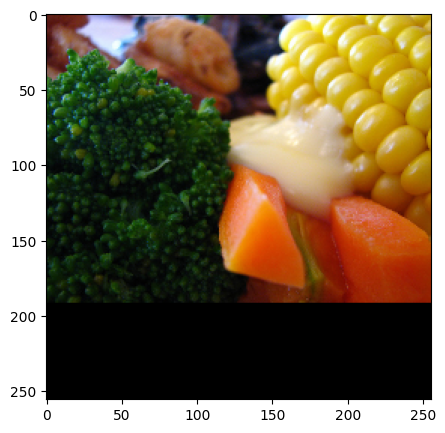

In [20]:
def padding_zero_clf(image):
    max_side = tf.reduce_max(tf.shape(image)[:2])
    image_ = tf.image.pad_to_bounding_box(image, 0, 0, max_side, max_side)
    return image_

def resize_clf(image, w, h):
    image_ = tf.image.resize(image, [w, h])
    return image_

def preprocess_image_clf(image_data, w, h):
    image_data = padding_zero_clf(image_data)
    image_data = resize_clf(image_data, w, h)
    return tf.convert_to_tensor(image_data, dtype=tf.float32)

file = train_target.iloc[260]
img_t = image_to_tensor(src_path+"train2017/"+file.file_name)
img_t = preprocess_image_clf(img_t, w=img_shape, h=img_shape)

plt.figure(figsize=(w_disp, h_disp))
plt.imshow(img_t[...,::-1]);

## Pre-procesando el set de imagenes

In [21]:
classes_ids = tf.cast([train_cat.loc[train_cat.name == x, "id"].values[0] for x in targets], tf.float32)
classes_ids

<tf.Tensor: shape=(10,), dtype=float32, numpy=array([52., 53., 54., 55., 56., 57., 58., 59., 60., 61.], dtype=float32)>

In [22]:
def get_class_ids(category_id=None):
    dict_class = {target:i for i, target in enumerate(targets)}
    if category_id is None:
        return dict_class
    else:
        return dict_class[train_cat.loc[train_cat.id == category_id, "name"].values[0]]

def transform_classes(ids):
    ids = tf.cast(ids, tf.float32)
    return tf.where(classes_ids == tf.expand_dims(ids, axis=-1))[..., 1]

def preprocess_data_clf(image_data, bbox, class_ids):
    image_data = preprocess_image_clf(image_data, w=img_shape, h=img_shape)
    image_data = preprocess_input(image_data)
    class_ids_ = transform_classes(class_ids)
    class_ids_ = tf.reduce_max(tf.one_hot(class_ids_, depth=num_classes), axis=0)
    class_ids_ = tf.reshape(class_ids_, [num_classes])
    return tf.cast(image_data, dtype=tf.float32), tf.cast(class_ids_, dtype=tf.int8)

batch_size = 8
num_classes = 10

train_dataset_clf = train_dataset.map(preprocess_data_clf, num_parallel_calls=autotune)
train_dataset_clf = train_dataset_clf.shuffle(8 * batch_size)
train_dataset_clf = train_dataset_clf.batch(batch_size)
train_dataset_clf = train_dataset_clf.prefetch(autotune)

val_dataset_clf = val_dataset.map(preprocess_data_clf, num_parallel_calls=autotune)
val_dataset_clf = val_dataset_clf.batch(batch_size)
val_dataset_clf = val_dataset_clf.prefetch(autotune)

2024-03-01 23:30:05.147499: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


### Previsualizando el set de imagenes de entrenamiento

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


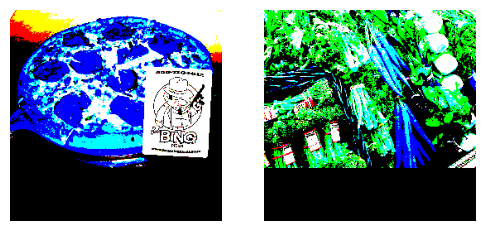

In [23]:
fig, axs = plt.subplots(1, 2, figsize=(w_disp, h_disp))
for i, data in enumerate(train_dataset_clf.take(1).unbatch()):
    plt.subplot(1, 2, i+1)
    plt.axis("off")
    plt.imshow(data[0]);
    if i == 1:
        break

## Arquitectura del clasificador de imagenes multi-label

### Salidas del backbone

In [24]:
resnet = ResNet50(input_shape=(img_shape, img_shape, 3), include_top=False)

img_ = np.copy(data[0])[np.newaxis,:]
for i, layer in enumerate(resnet.layers):
    if "out" in layer.name:
        output = K.function([resnet.layers[0].input], [layer.output])
        print(output(img_)[0].shape, i)

2024-03-01 16:30:22.743940: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8900

2024-03-01 16:30:23.350400: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


(1, 64, 64, 256) 18

(1, 64, 64, 256) 28

(1, 64, 64, 256) 38

(1, 32, 32, 512) 50

(1, 32, 32, 512) 60

(1, 32, 32, 512) 70

(1, 32, 32, 512) 80

(1, 16, 16, 1024) 92

(1, 16, 16, 1024) 102

(1, 16, 16, 1024) 112

(1, 16, 16, 1024) 122

(1, 16, 16, 1024) 132

(1, 16, 16, 1024) 142

(1, 8, 8, 2048) 154

(1, 8, 8, 2048) 164

(1, 8, 8, 2048) 174


### Modelo

In [74]:
output_layer = 142
backbone_clf = ResNet50(input_shape=(img_shape, img_shape, 3), include_top=False)
backbone_clf.trainable = False
backbone_clf = Model(inputs=[backbone_clf.input], outputs=[backbone_clf.layers[output_layer].output])

model_clf = Sequential(layers=[
    Input(shape=(None, None, 3)),
    RandomFlip("horizontal"),
    RandomRotation(0.25),

    backbone_clf,
 
    GlobalAveragePooling2D(),
    
    Dense(1024, activation="relu"),
    Dropout(0.5),
    Dense(256, activation="relu"),
    Dropout(0.5),
    Dense(64, activation="relu"),
    
    Dense(num_classes, activation="sigmoid")
])

lr_init = 5e-5

model_clf.compile(loss=BinaryCrossentropy(),
             optimizer=AdamW(learning_rate=lr_init, weight_decay=0.01))

### Ploteando la arquitectura

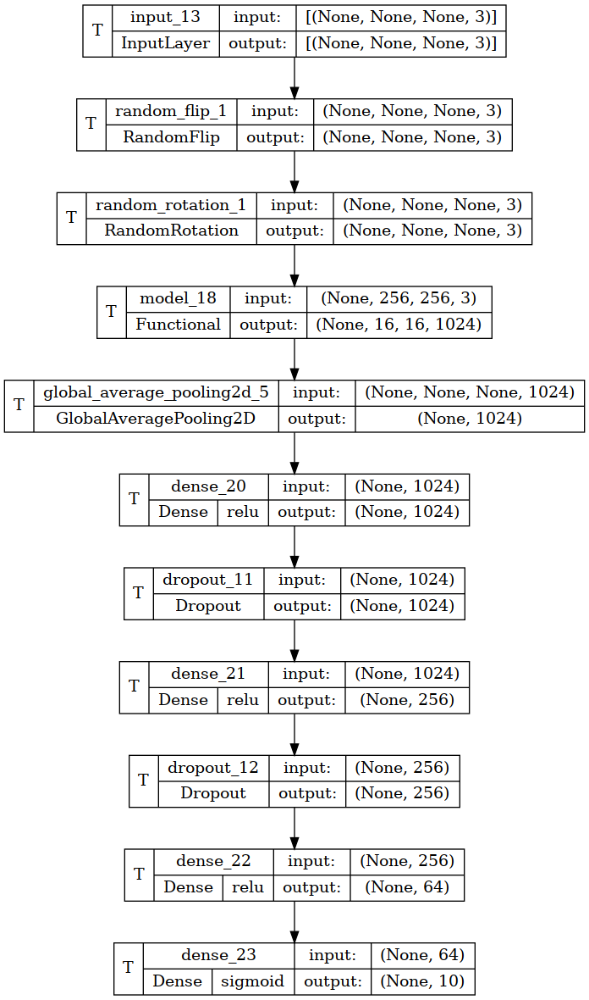

In [75]:
plot_model(model_clf, show_shapes=True, show_layer_activations=True, show_trainable=True)

## Entrenamiento del modelo
### Buscando el learning rate optimo

In [44]:
epochs = 15
lr_scheduler = LearningRateScheduler(lambda epoch: lr_init * 10**(epoch/5))

history_clf = model_clf.fit(train_dataset_clf.take(188), #188*8 = 1504 imagenes
                     epochs=epochs,
                     callbacks=[lr_scheduler],
                     verbose=1)

Epoch 1/15


2024-03-01 23:36:04.361061: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer

2024-03-01 23:36:06.279058: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7f7d0c15d600 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:

2024-03-01 23:36:06.279096: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce GTX 1050 Ti, Compute Capability 6.1

2024-03-01 23:36:06.296317: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.

2024-03-01 23:36:06.439718: I ./tensorflow/compiler/jit/device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


188/188 [==============================] - 24s 101ms/step - loss: 0.5642 - lr: 5.0000e-05

Epoch 2/15

188/188 [==============================] - 19s 101ms/step - loss: 0.3754 - lr: 7.9245e-05

Epoch 3/15

188/188 [==============================] - 19s 100ms/step - loss: 0.3324 - lr: 1.2559e-04

Epoch 4/15

188/188 [==============================] - 19s 101ms/step - loss: 0.3015 - lr: 1.9905e-04

Epoch 5/15

188/188 [==============================] - 19s 103ms/step - loss: 0.2967 - lr: 3.1548e-04

Epoch 6/15

188/188 [==============================] - 19s 102ms/step - loss: 0.2893 - lr: 5.0000e-04

Epoch 7/15

188/188 [==============================] - 19s 102ms/step - loss: 0.2877 - lr: 7.9245e-04

Epoch 8/15

188/188 [==============================] - 19s 102ms/step - loss: 0.2862 - lr: 0.0013

Epoch 9/15

188/188 [==============================] - 19s 102ms/step - loss: 0.2998 - lr: 0.0020

Epoch 10/15

188/188 [==============================] - 19s 101ms/step - loss: 0.3141 - lr: 0

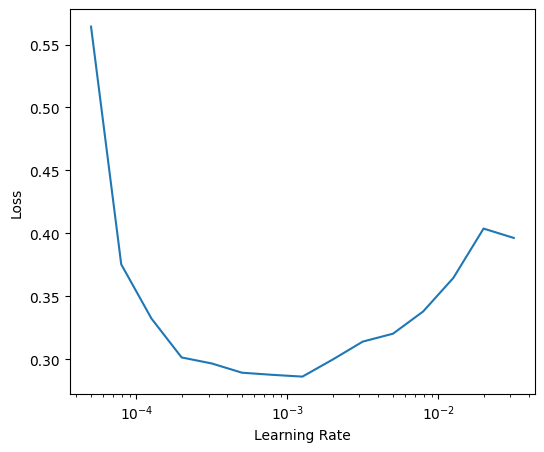

In [45]:
lrs = lr_init * (10**(np.arange(epochs)/5))
plt.figure(figsize=(w_disp, h_disp))
plt.semilogx(lrs, history_clf.history['loss'])
plt.xlabel('Learning Rate')
plt.ylabel('Loss');

### Entrenamiento

In [62]:
backbone_clf = ResNet50(input_shape=(img_shape, img_shape, 3), include_top=False)
backbone_clf.trainable = False

model_clf = Sequential(layers=[
    Input(shape=(None, None, 3)),
    RandomFlip("horizontal"),
    RandomRotation(0.25),

    backbone_clf,
    
    GlobalAveragePooling2D(),
    
    Dense(1024, activation="relu"),
    Dropout(0.5),
    Dense(256, activation="relu"),
    Dropout(0.5),
    Dense(64, activation="relu"),
    
    Dense(num_classes, activation="sigmoid")
])

model_clf.compile(loss=BinaryCrossentropy(),
             optimizer=AdamW(learning_rate=3e-4, weight_decay=0.01),
             metrics=["accuracy"])

early_stop = EarlyStopping(monitor = 'val_loss', patience = 3)
epochs = 40

load_model_clf = False
if load_model_clf == True:
    model_clf = tf.keras.models.load_model(dst_path+'model_clf.keras')

history_clf2 = model_clf.fit(train_dataset_clf.take(375), #375*16 = 6000 imagenes
                        validation_data=val_dataset_clf,
                        epochs=epochs,
                        callbacks=[early_stop],
                        verbose=1)

model_clf.save(dst_path+'model_clf.keras')|

Epoch 1/40

375/375 [==============================] - 50s 125ms/step - loss: 0.3817 - accuracy: 0.2787 - val_loss: 0.2962 - val_accuracy: 0.4054

Epoch 2/40

375/375 [==============================] - 46s 123ms/step - loss: 0.3016 - accuracy: 0.4143 - val_loss: 0.2647 - val_accuracy: 0.4845

Epoch 3/40

375/375 [==============================] - 47s 124ms/step - loss: 0.2733 - accuracy: 0.4803 - val_loss: 0.2522 - val_accuracy: 0.5353

Epoch 4/40

375/375 [==============================] - 47s 124ms/step - loss: 0.2588 - accuracy: 0.5137 - val_loss: 0.2428 - val_accuracy: 0.5438

Epoch 5/40

375/375 [==============================] - 47s 125ms/step - loss: 0.2489 - accuracy: 0.5363 - val_loss: 0.2392 - val_accuracy: 0.5862

Epoch 6/40

375/375 [==============================] - 47s 124ms/step - loss: 0.2401 - accuracy: 0.5467 - val_loss: 0.2352 - val_accuracy: 0.5565

Epoch 7/40

375/375 [==============================] - 47s 124ms/step - loss: 0.2308 - accuracy: 0.5563 - val_loss: 0.

### Visualizando la perfomance del modelo durante el entrenamiento

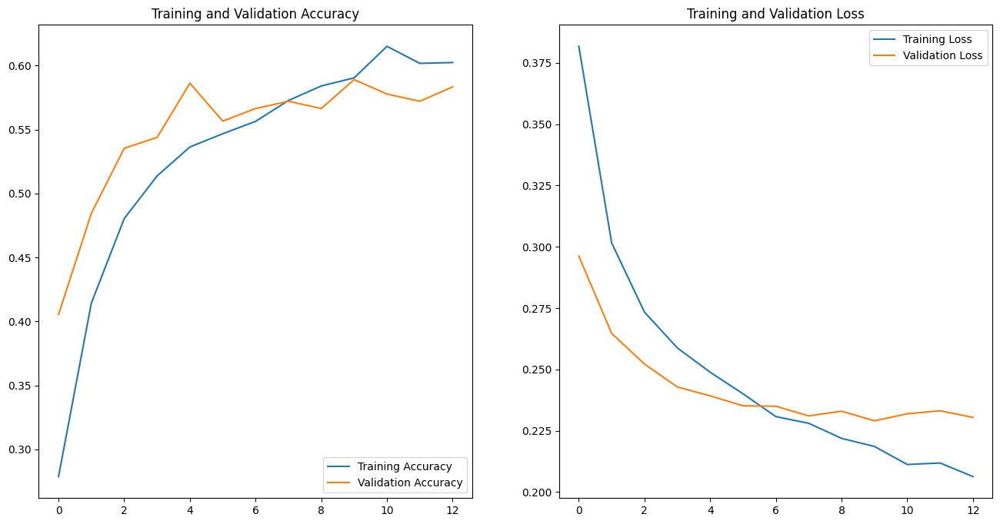

In [63]:
plot_history(history_clf2, metric="accuracy")

In [64]:
loss_clf, acc_clf = model_clf.evaluate(val_dataset_clf)
print(f"Performance sobre el set de validación\nLoss: {loss_clf}, Accuracy: {acc_clf}")

89/89 [==============================] - 8s 82ms/step - loss: 0.2304 - accuracy: 0.5833

Performance sobre el set de validación

Loss: 0.23043112456798553, Accuracy: 0.5833333134651184


## Visualizando predicciones

1/1 [==============================] - 1s 713ms/step

1/1 [==============================] - 0s 27ms/step

1/1 [==============================] - 0s 20ms/step

1/1 [==============================] - 0s 24ms/step

1/1 [==============================] - 0s 23ms/step

1/1 [==============================] - 0s 21ms/step

1/1 [==============================] - 0s 19ms/step

1/1 [==============================] - 0s 23ms/step

1/1 [==============================] - 0s 20ms/step


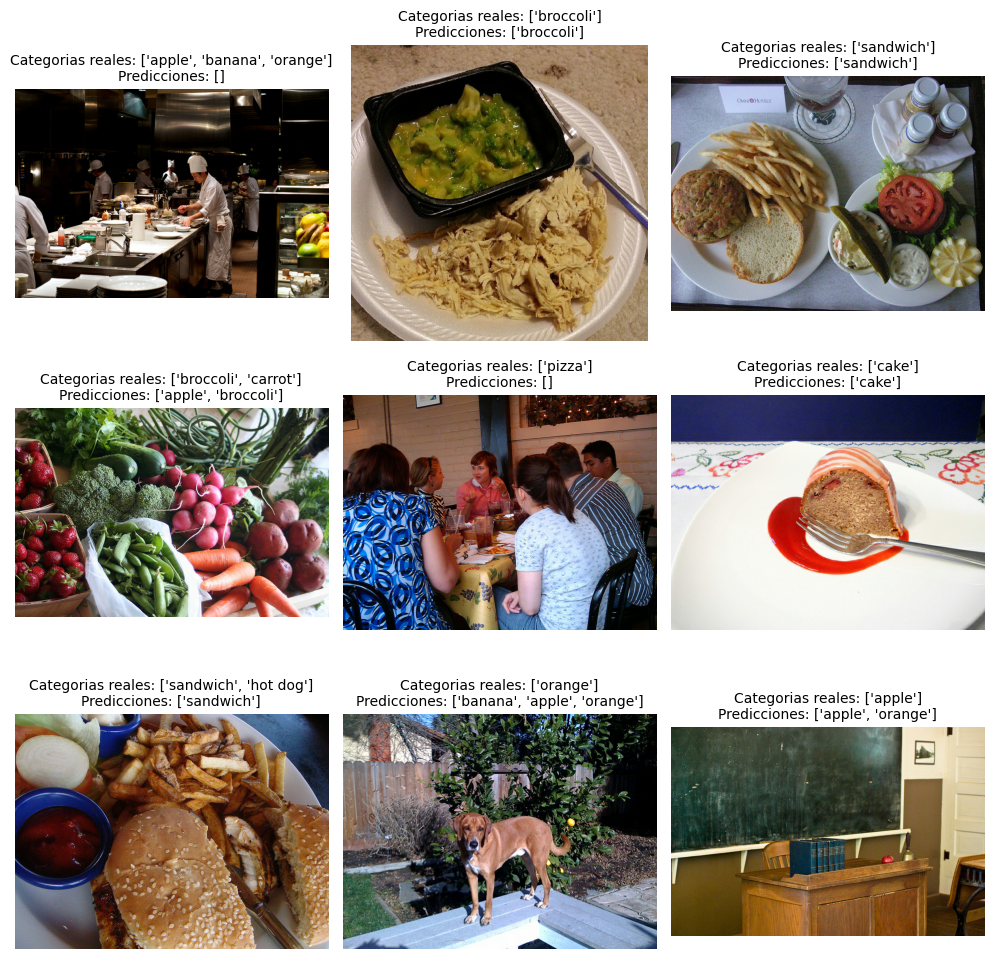

In [65]:
fig, axs = plt.subplots(3, 3, figsize=(10, 10))

for i, data in enumerate(val_dataset.shuffle(100).take(9)):
    img_pre = preprocess_image_clf(data[0], w=img_shape, h=img_shape)
    img_pre = tf.keras.applications.resnet50.preprocess_input(img_pre)
    
    predict = model_clf.predict(tf.expand_dims(img_pre, axis=0))
    predict_bool = (predict[0] > .5)
    class_ids = list(get_class_ids().keys())
    classes = []
    classes_reales = []
    
    for k, x in enumerate(predict_bool):
        if bool(x) is True:
            classes.append(class_ids[k])
            
    for x in data[2].numpy():
            classes_reales.append(class_ids[get_class_ids(x)])
    
    plt.subplot(3, 3, i+1)
    plt.imshow(data[0])
    plt.axis('off')
    plt.title(f"Categorias reales: {list(set(classes_reales))}\nPredicciones: {classes}", fontsize=10)
plt.tight_layout()

# Localizador con Regional Proposal Network (RPN)
## Redimensionando imagenes y bounding boxes manteniendo la relación de aspecto

In [24]:
img_shape = 256

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


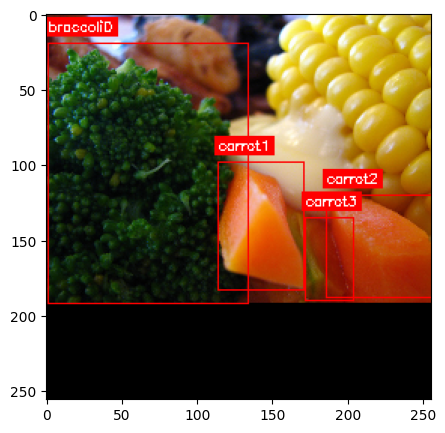

In [25]:
def add_bbox(img, bbox, category_name=None, fontScale=0.6, color=(0, 0, 255), lw=1):
    bbox_ = bbox.astype(int)
    img_ = cv2.rectangle(img, (bbox_[0], bbox_[1]), (bbox_[2], bbox_[3]), color, lw)
    if category_name is not None:
        labelSize, baseLine = cv2.getTextSize(category_name, cv2.FONT_HERSHEY_SIMPLEX, fontScale, 1)
        img_ = cv2.rectangle(img_, (bbox_[0]-2, bbox_[1] - labelSize[1] - 10),(bbox_[0] + labelSize[0]+2, bbox_[1] + baseLine - 8), color, cv2.FILLED)
        img_ = cv2.putText(img_, category_name, (bbox_[0], bbox_[1] - 8), cv2.FONT_HERSHEY_SIMPLEX, fontScale, (255, 255, 255))
    return img_

def resize_loc(image, w, h, bbox=None):
    image_shape = tf.cast(tf.shape(image)[:2], dtype=tf.float32)
    max_side = tf.reduce_max(image_shape)
    ratio = tf.cast(tf.reduce_max([w, h]), dtype=tf.float32) / max_side
    image_shape = image_shape * ratio
    image_ = tf.image.resize(image, tf.cast(tf.math.ceil(image_shape), dtype=tf.int32))
    
    if bbox is not None:
        original_image_shape = tf.cast(tf.shape(image)[:2], dtype=tf.float32)
        
        x_scale = image_shape[1] / original_image_shape[1]
        y_scale = image_shape[0] / original_image_shape[0]
        
        x_scale = tf.cast(x_scale, dtype=tf.float32)
        y_scale = tf.cast(y_scale, dtype=tf.float32)
        bbox = tf.cast(bbox ,dtype=tf.float32)
        
        bbox = tf.stack(
            [
                tf.math.multiply(bbox[..., 0], x_scale),
                tf.math.multiply(bbox[..., 1], y_scale),
                tf.math.multiply(bbox[..., 2], x_scale),
                tf.math.multiply(bbox[..., 3], y_scale),
            ],
            axis=-1,
        )
    return image_, bbox

def preprocess_image_loc(image_data, w, h, bbox):
    image_data_, bbox = resize_loc(image_data, w, h, bbox)
    original_image_shape = tf.cast(tf.shape(image_data_), dtype=tf.float32)
    image_data_ = padding_zero_clf(image_data_)
    return tf.convert_to_tensor(image_data_, dtype=tf.float32), tf.cast(bbox, dtype=tf.float32), original_image_shape

id_img = 260
file = train_target.iloc[id_img] #3 260
img_t_ = image_to_tensor(src_path+"train2017/"+file.file_name)
img_t, bboxs, original_image_shape = preprocess_image_loc(img_t_, w=img_shape, h=img_shape, bbox=tf.convert_to_tensor(file.bbox))
img_t_npy = img_t.numpy()

i=0
for bbox, category_name in zip(bboxs, file.category_name):
    img_t_npy = add_bbox(img_t_npy, bbox.numpy(), category_name+str(i), fontScale=0.3, lw=1)
    i += 1

plt.figure(figsize=(w_disp, h_disp))
plt.imshow(img_t_npy[...,::-1]);

## Salidas del backbone y eleccion del tamaño de feature map

In [26]:
resnet = ResNet50(input_shape=(None, None, 3), include_top=False)

img_ = np.copy(img_t)[np.newaxis,:]
for i, layer in enumerate(resnet.layers):
    if "out" in layer.name:
        output = K.function([resnet.layers[0].input], [layer.output])
        print(output(img_)[0].shape, i)

2024-03-01 23:31:32.756019: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8900

2024-03-01 23:31:33.003619: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory


(1, 64, 64, 256) 18

(1, 64, 64, 256) 28

(1, 64, 64, 256) 38

(1, 32, 32, 512) 50

(1, 32, 32, 512) 60

(1, 32, 32, 512) 70

(1, 32, 32, 512) 80

(1, 16, 16, 1024) 92

(1, 16, 16, 1024) 102

(1, 16, 16, 1024) 112

(1, 16, 16, 1024) 122

(1, 16, 16, 1024) 132

(1, 16, 16, 1024) 142

(1, 8, 8, 2048) 154

(1, 8, 8, 2048) 164

(1, 8, 8, 2048) 174


In [27]:
output_layer = 80
backbone = Model(inputs=[resnet.layers[0].input], outputs=[resnet.layers[output_layer].output])
features_maps_shape = backbone.predict(img_).shape
features_maps_shape

1/1 [==============================] - 1s 579ms/step


(1, 32, 32, 512)

## Generando anchor boxes
### Cantidad de anchor boxes por tamaño de feature map

In [28]:
_, w_feature_map, h_feature_map, _ = features_maps_shape
n_anchor_centers = w_feature_map * h_feature_map
n_anchor_centers

1024

### Distribuyendo anchor boxes

In [29]:
def get_anchors_centers(img_shape, w_feature_map, h_feature_map):
    x_stride = int(img_shape/w_feature_map)
    y_stride = int(img_shape/h_feature_map)

    x_center = tf.range(x_stride/2, img_shape, x_stride)
    y_center = tf.range(y_stride/2, img_shape, y_stride)

    center_list = tf.cast(tf.reshape(tf.transpose(tf.meshgrid(x_center, y_center, indexing='xy')), [-1, 2]), dtype=tf.float32)
    return x_center, y_center, center_list

x_center, y_center, center_list = get_anchors_centers(img_shape, w_feature_map, h_feature_map)
center_list

<tf.Tensor: shape=(1024, 2), dtype=float32, numpy=
array([[  4.,   4.],
       [  4.,  12.],
       [  4.,  20.],
       ...,
       [252., 236.],
       [252., 244.],
       [252., 252.]], dtype=float32)>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


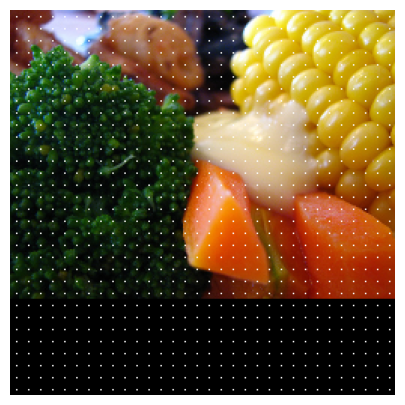

In [30]:
img_ = np.copy(img_t)
plt.figure(figsize=(w_disp, h_disp))
for i in range(n_anchor_centers):
    cv2.circle(img_, (int(center_list[i][0]), int(center_list[i][1])), radius=0, color=(255, 255, 255), thickness=1) 
plt.imshow(img_[...,::-1])
plt.axis("off")
plt.show()

### Generando grilla de anchor boxes con distintos ratios y escalas

In [31]:
def get_anchor_boxes(center_list, img_shape):
    # (x0, y0)*================= .
    #         =                = .
    #         =      Area      = h
    #         =                = .
    #         =================* .
    #         <------ w -------> (x1, y1)

    # area = w * h

    # ratio = w / h --> w = ratio * h --> area = ratio * h**2 --> h = np.sqrt(area/ratio)
    #               --> h = w / ratio
    
    #El area total de la imagen (si la imagen es de 256 x 256) es 256x256=65536
    
    ratios = tf.reshape(tf.constant([0.5, 1, 2]), [3, 1])
    scales = tf.constant([
        #(img_shape/16),
        (img_shape/8),
        (img_shape/4),
        (img_shape/2), 
        (img_shape/1.5)
        ])

    h = tf.math.sqrt(tf.math.divide(tf.pow(scales, 2), ratios))
    w = tf.transpose(tf.math.multiply(ratios, h))
    h = tf.transpose(h)

    #Normalizacion
    w = tf.reshape(w, [-1]) #/ img_shape
    h = tf.reshape(h, [-1]) #/ img_shape

    base_anchors = tf.stack([-w/2, -h/2, w/2, h/2], axis=1)
    grid_map = tf.concat([center_list, center_list], axis=1) #/ img_shape
    anchors = tf.reshape(base_anchors, (1, -1, 4)) + tf.reshape(grid_map, (-1, 1, 4))
    anchors = tf.reshape(anchors, (-1, 4))
    
    return anchors, len(scales) * len(ratios)

n_anchor_centers = w_feature_map * h_feature_map
anchor_list, n_anchors_per_center = get_anchor_boxes(center_list, img_shape)

anchor_list

<tf.Tensor: shape=(12288, 4), dtype=float32, numpy=
array([[ -7.3137083, -18.627417 ,  15.313708 ,  26.627417 ],
       [-12.       , -12.       ,  20.       ,  20.       ],
       [-18.627417 ,  -7.3137083,  26.627417 ,  15.313708 ],
       ...,
       [191.66022  , 131.32043  , 312.33978  , 372.67957  ],
       [166.66666  , 166.66666  , 337.33334  , 337.33334  ],
       [131.32043  , 191.66022  , 372.67957  , 312.33978  ]],
      dtype=float32)>

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


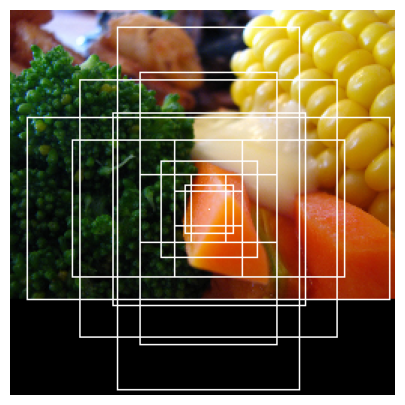

In [32]:
img_ = np.copy(img_t)
center_point = n_anchor_centers//2 + len(x_center)//2

for i in range(center_point*n_anchors_per_center, center_point*n_anchors_per_center + n_anchors_per_center):
    x0 = int(anchor_list[i][0])
    y0 = int(anchor_list[i][1])
    x1 = int(anchor_list[i][2])
    y1 = int(anchor_list[i][3])
    cv2.rectangle(img_, (x0, y0), (x1, y1), color=(255, 255, 255), thickness=1)
    
cv2.circle(img_, (int(center_list[center_point][0]), int(center_list[center_point][1])), radius=0, color=(255, 255, 255), thickness=1) 
    
plt.figure(figsize=(w_disp, h_disp))
plt.imshow(img_[...,::-1])
plt.axis("off")
plt.show()

## Intersection over Union (IoU)

<img src="https://drive.google.com/uc?export=view&id=1FFF96u89hEnlXSofYZk0rtd6JopligH9" width=400>

Un criterio que se puede emplear es comparar la similitud de los anchor boxes generados sobre cada pixel con los bounding boxes originales de la imagen, de esta forma podriamos seleccionar los anchor boxes que estan mas relacionados con el objeto de analisis de nuestra imagen.

Una forma de lograr esto consiste en utilizar la metrica de comparacion denominada Intersection over Union (IoU) o Jaccard Index el cual consiste en un cociente entre la interseccion y la union de dos areas cualesquiera, para nosotros, las areas de analisis seran un anchor box cualquiera y el bounding box de nuestro objeto. El rango de esta metrica se encuentra entre 0 y 1, siendo 0 la ausencia de superposicion entre ambas areas, mientras que 1 indica que ambos cuadros son iguales. Por lo tanto, aquellos cuadros con IoU cercanos a 1 seran de mucha utilidad para la localizacion de nuestro objeto.

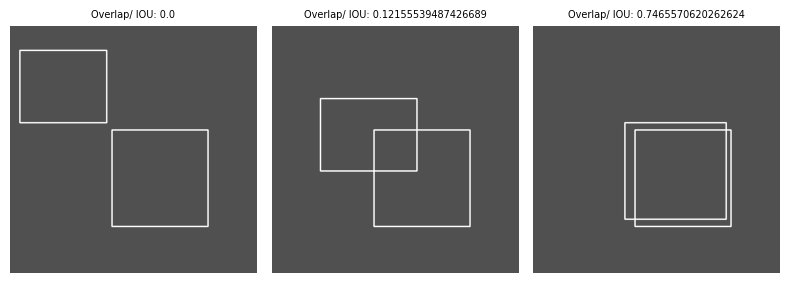

In [33]:
def center2corner(boxes):
    return tf.cast(tf.concat([boxes[..., :2] - (boxes[..., 2:] / 2.0), boxes[..., :2] + (boxes[..., 2:] / 2.0)], axis=-1), dtype=tf.float32)

def corner2center(boxes):
    return tf.cast(tf.concat([(boxes[..., :2] + boxes[..., 2:]) / 2.0, boxes[..., 2:] - boxes[..., :2]], axis=-1), dtype=tf.float32)

def iou(boxesA, boxesB):
    left_upper = tf.maximum(boxesA[..., None, :2], boxesB[..., :2])
    right_down = tf.minimum(boxesA[..., None, 2:], boxesB[..., 2:])
    
    intersection = tf.maximum(0.0, right_down - left_upper)
    intersection_area = intersection[:, :, 0] * intersection[:, :, 1]
    
    boxesA_area = (boxesA[..., 2] - boxesA[..., 0]) * (boxesA[..., 3] - boxesA[..., 1])
    boxesB_area = (boxesB[..., 2] - boxesB[..., 0]) * (boxesB[..., 3] - boxesB[..., 1])
    
    union_area = tf.maximum(boxesA_area[:, None] + boxesB_area - intersection_area, 1e-8)
    return tf.clip_by_value(intersection_area / union_area, 0.0, 1.0)

box1 = np.array([[20., 50., 200., 200.], [100., 150., 300., 300.], [190., 200., 400., 400.]])
box2 = np.array([[211., 215., 410., 415.]])

img_ = np.zeros([512,512,3],dtype=np.uint8)
img_.fill(80)

cv2.rectangle(img_, (int(box2[0][0]), int(box2[0][1])), (int(box2[0][2]), int(box2[0][3])), color=(255, 255, 255), thickness=2)

metric_iou = iou(box1, box2)

plt.subplots(1, 3, figsize=(8, h_disp))
for i, bbox in enumerate(box1.astype(int)):
    img__ = np.copy(img_)
    cv2.rectangle(img__, (bbox[0], bbox[1]), (bbox[2], bbox[3]), color=(255, 255, 255), thickness=2)
    plt.subplot(1, 3, i+1)
    plt.axis("off")
    plt.imshow(img__)
    plt.title(f"Overlap/ IOU: {iou(box1, box2)[i][0]}", fontsize=7)
    
plt.tight_layout()

In [34]:
metric_iou = iou(anchor_list, bboxs)
metric_iou

<tf.Tensor: shape=(12288, 4), dtype=float32, numpy=
array([[3.83222895e-03, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [9.44545827e-05, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       ...,
       [0.00000000e+00, 0.00000000e+00, 1.22434884e-01, 2.27227379e-02],
       [0.00000000e+00, 2.53040949e-03, 4.78444770e-02, 2.51415931e-02],
       [2.15919590e-05, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00]],
      dtype=float32)>

### Clasificación de los anchor boxes

Aquellos cuadros delimitadores que obtenga un IoU mayor 0.5 seran denominados como cuadros positivos (1) indicando la presencia de un objeto de interes, por otro lado aquellos cuadros que obtengan un IoU menor a 0.3 seran clasificados como cuadros negativos (0) indicando la ausencia de objetos de interes, estos cuadros por lo general tienen informacion del background de la imagen. Mientras que aquellos cuadros que obtenga un IoU entre 0.3 y 0.5 seran ignorados (-1) durante el entrenamiento, tambien seran ignorados aquellos cuadros que sobrepasen los limites de la imagen.

In [35]:
def classify_anchor_boxes(anchor_list, metric_iou, img_shape):    
    labels = tf.ones([len(anchor_list)]) * (-1.)

    labels = tf.where(tf.reduce_any(metric_iou <= 0.3, axis=-1), 0., labels)

    labels = tf.where(
        (anchor_list[..., 0] < 0) |
        (anchor_list[..., 1] < 0) |
        (anchor_list[..., 2] > img_shape) |
        (anchor_list[..., 3] > img_shape),
        -1., labels)

    labels = tf.where(tf.reduce_any(metric_iou >= 0.5, axis=-1), 1., labels)
    
    range_labels = tf.range(len(labels), dtype=tf.int64)
    max_metric_iou = tf.expand_dims(tf.argmax(metric_iou, axis=0), axis=-1)
    labels = tf.where(tf.reduce_any(tf.math.equal(range_labels, max_metric_iou), axis=0) == True, 1., labels)
    
    return labels

labels = classify_anchor_boxes(anchor_list, metric_iou, img_shape)

len(tf.where(labels == 1)), len(tf.where(labels == 0)), len(tf.where(labels == -1))

(384, 4619, 7285)

#### Visualización de anchor boxes positivos

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


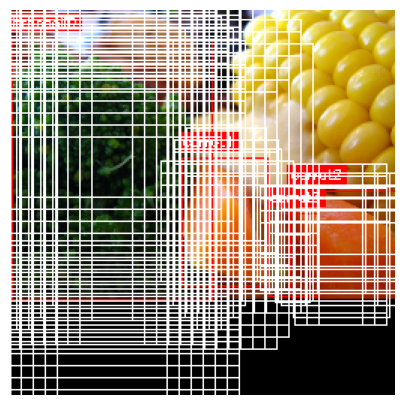

In [36]:
img_ = np.copy(img_t)

i=0
for bbox, category_name in zip(bboxs, file.category_name):
    img_ = add_bbox(img_, bbox.numpy(), category_name+str(i), fontScale=0.3, lw=1)
    i += 1

for i in tf.gather_nd(anchor_list, tf.where(labels == 1)):
    x0 = int(i[0])
    y0 = int(i[1])
    x1 = int(i[2])
    y1 = int(i[3])
    cv2.rectangle(img_, (x0, y0), (x1, y1), color=(255, 255, 255), thickness=1)
    
plt.figure(figsize=(w_disp, h_disp))
plt.imshow(img_[...,::-1])
plt.axis("off")
plt.show()

#### Lidiando con el desbalance de clases

Debido a que por lo general la clase negativa tendra mayores muestras que la clase positiva, se busca un blaance de forma tal de mantener un relacion lineal entre ambas clases.

In [37]:
def balance_anchors_class(labels):
    len_positives = tf.size(tf.where(labels == 1))
    labels_idx = tf.cast(tf.where(labels == 0.), dtype=tf.int32)

    random_idx, _= tf.unique(tf.experimental.numpy.random.randint(0, tf.size(labels_idx, out_type=tf.int64), 1000))
    random_idx = tf.squeeze(tf.gather(labels_idx, random_idx))
    keep_labels_idx = tf.cast(random_idx[:len_positives*2], dtype=tf.int32)
    range_labels_idx = tf.expand_dims(tf.range(len(labels)), axis=-1)

    mask = tf.reduce_any(tf.math.equal(range_labels_idx, keep_labels_idx), axis=-1)
    labels = tf.where(labels == 0., -1., labels)
    labels = tf.where(mask, 0., labels)
    
    return labels

labels = balance_anchors_class(labels)

len(tf.where(labels == 1)), len(tf.where(labels == 0)), len(tf.where(labels == -1))

(384, 768, 11136)

#### Visualizacion de anchor boxes negativos y positivos

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


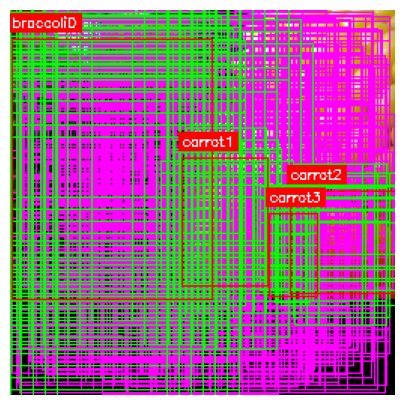

In [38]:
img_ = np.copy(img_t)

for i in tf.gather_nd(anchor_list, tf.where(labels == 0)):
    x0 = int(i[0])
    y0 = int(i[1])
    x1 = int(i[2])
    y1 = int(i[3])
    cv2.rectangle(img_, (x0, y0), (x1, y1), color=(255, 0, 255), thickness=1)

for i in tf.gather_nd(anchor_list, tf.where(labels == 1)):
    x0 = int(i[0])
    y0 = int(i[1])
    x1 = int(i[2])
    y1 = int(i[3])
    cv2.rectangle(img_, (x0, y0), (x1, y1), color=(0, 255, 0), thickness=1)
    
i=0
for bbox, category_name in zip(bboxs, file.category_name):
    img_ = add_bbox(img_, bbox.numpy(), category_name+str(i), fontScale=0.3, lw=1)
    i += 1

plt.figure(figsize=(w_disp, h_disp))
plt.imshow(img_[...,::-1])
plt.axis("off")
plt.show()

## Compensamiento de posicion de los anchor boxes respecto de los cuadros originales

In [39]:
def get_offset(bboxs, anchor_list, metric_iou):
    gt_boxes = tf.gather(corner2center(bboxs), tf.math.argmax(metric_iou, axis=1))
    anchor_list_center = corner2center(anchor_list)
    
    xa, x_gt = anchor_list_center[:, 0], gt_boxes[:, 0]
    ya, y_gt = anchor_list_center[:, 1], gt_boxes[:, 1]
    wa, w_gt = anchor_list_center[:, 2], gt_boxes[:, 2]
    ha, h_gt = anchor_list_center[:, 3], gt_boxes[:, 3]

    dx = (x_gt - xa) / wa
    dy = (y_gt - ya) / ha
    dw = tf.math.log(w_gt / wa)
    dh = tf.math.log(h_gt / ha)
    
    return tf.stack([dx, dy, dw, dh], axis=1)
   
offsets = get_offset(bboxs, anchor_list, metric_iou)
offsets

<tf.Tensor: shape=(12288, 4), dtype=float32, numpy=
array([[ 2.8379734 ,  2.252533  ,  1.7698025 ,  1.3359057 ],
       [ 2.00675   ,  3.1855626 ,  1.4232289 ,  1.6824791 ],
       [ 1.4189867 ,  4.505066  ,  1.0766553 ,  2.0290527 ],
       ...,
       [-0.2563483 , -0.40395406, -0.5464739 , -1.2570028 ],
       [-0.18126564, -0.57127726, -0.8930476 , -0.91042924],
       [-0.7614545 , -1.2103292 , -0.5973213 ,  0.35507628]],
      dtype=float32)>

### Filtrado del compensamiento sobre anchor boxes ignorados

In [53]:
def filter_offsets(offsets, labels):
    return tf.where(tf.expand_dims(labels == -1., axis=-1), tf.constant([0., 0., 0., 0.]), offsets)
    
offsets = filter_offsets(offsets, labels)
offsets

<tf.Tensor: shape=(12288, 4), dtype=float32, numpy=
array([[0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.]], dtype=float32)>

## Pre-procesando el set de imagenes

In [54]:
def preprocess_data_loc(image_data, bbox, class_ids):
    image_data_, bboxs, _ = preprocess_image_loc(image_data, w=img_shape, h=img_shape, bbox=bbox)
    
    _, w_feature_map, h_feature_map, _ = features_maps_shape
    #n_anchor_centers = w_feature_map * h_feature_map
    _, _, center_list = get_anchors_centers(img_shape, w_feature_map, h_feature_map)
    anchor_list, n_anchors_per_center = get_anchor_boxes(center_list, img_shape)

    metric_iou = iou(anchor_list, bboxs)
    labels = classify_anchor_boxes(anchor_list, metric_iou, img_shape)
    labels = balance_anchors_class(labels)
    
    offsets = get_offset(bboxs, anchor_list, metric_iou)
    offsets = filter_offsets(offsets, labels)
    offsets = tf.concat([offsets, tf.expand_dims(labels, axis=-1)], axis=1)
    
    image_data_ = preprocess_input(image_data_)
    offsets = tf.reshape(offsets, shape=(w_feature_map, h_feature_map, n_anchors_per_center*5))
    labels = tf.reshape(labels, shape=(w_feature_map, h_feature_map, n_anchors_per_center*1))

    return tf.cast(image_data_, dtype=tf.float32), (tf.cast(offsets, dtype=tf.float32), tf.cast(labels, dtype=tf.float32))

batch_size = 8

train_dataset_loc = train_dataset.map(preprocess_data_loc, num_parallel_calls=autotune)
train_dataset_loc = train_dataset_loc.batch(batch_size)
train_dataset_loc = train_dataset_loc.shuffle(8*batch_size, seed=seed)
train_dataset_loc = train_dataset_loc.prefetch(autotune)

val_dataset_loc = val_dataset.map(preprocess_data_loc, num_parallel_calls=autotune)
val_dataset_loc = val_dataset_loc.batch(batch_size)
val_dataset_loc = val_dataset_loc.prefetch(autotune)

## Arquitectura del modelo RPN

In [ ]:
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"

resnet = ResNet50(input_shape=(img_shape, img_shape, 3), include_top=False)
resnet.trainable = False

feature_extractor_map = resnet.layers[output_layer].output #(32, 32, 512)
#RPN
#drop = tf.keras.layers.SpatialDropout2D(0.4, 'channels_last')(feature_extractor_map)
conv1 = Conv2D(512, kernel_size=(3,3), padding="same", kernel_initializer=RandomNormal(stddev=0.01), bias_initializer=Zeros(), activation='relu')(feature_extractor_map)

conv3 = Conv2D(512, kernel_size=(1,1), padding="same", kernel_initializer=RandomNormal(stddev=0.01), bias_initializer=Zeros(), activation='relu')(conv1)
conv3_5 = Conv2D(512, kernel_size=(1,1), padding="same", kernel_initializer=RandomNormal(stddev=0.01), bias_initializer=Zeros(), activation='relu')(conv3)
conv3_6 = Conv2D(512, kernel_size=(1,1), padding="same", kernel_initializer=RandomNormal(stddev=0.01), bias_initializer=Zeros(), activation='relu')(conv3_5)

regresor = Conv2D(n_anchors_per_center*4, 
                kernel_size=(1,1),
                activation= "linear", 
                kernel_initializer=RandomNormal(stddev=0.01),
                bias_initializer=Zeros(),
                name="regresion")(conv3_6)

conv3_2 = Conv2D(512, kernel_size=(1,1), padding="same", kernel_initializer=RandomNormal(stddev=0.01), bias_initializer=Zeros(), activation='relu')(conv1)
conv3_3 = Conv2D(512, kernel_size=(1,1), padding="same", kernel_initializer=RandomNormal(stddev=0.01), bias_initializer=Zeros(), activation='relu')(conv3_2)
conv3_4 = Conv2D(512, kernel_size=(1,1), padding="same", kernel_initializer=RandomNormal(stddev=0.01), bias_initializer=Zeros(), activation='relu')(conv3_3)

clasificador = Conv2D(n_anchors_per_center*1,
                    kernel_size=(1,1), 
                    activation= "sigmoid", 
                    kernel_initializer=RandomNormal(stddev=0.01),
                    bias_initializer=Zeros(),
                    name="clasificacion")(conv3_4)

RPN = Model(inputs=[resnet.input], outputs=[regresor, clasificador])

### Funciones de perdida customizadas

In [55]:
#Referencia: https://arxiv.org/abs/1506.01497

@keras.saving.register_keras_serializable()
def smooth_l1_loss(y_true, y_pred):
    loss_fn = tf.keras.losses.Huber()
    loss = loss_fn(y_true, y_pred)
    return tf.reduce_mean(loss)

@keras.saving.register_keras_serializable()
def reg_loss(y_true, y_pred):
    lmbd = 10
    y_true = tf.reshape(y_true, (-1, 5))
    y_pred = tf.reshape(y_pred, (-1, 4))
    #y_pred = y_pred[..., :-1]

    offsets = y_true[..., :-1]
    labels = y_true[..., -1]

    indices = tf.equal(labels, 1.)
    target = tf.boolean_mask(offsets, indices)
    output = tf.boolean_mask(y_pred, indices)
    
    return lmbd*smooth_l1_loss(target, output)

@keras.saving.register_keras_serializable()
def cls_loss(y_true, y_pred):
    valid_indices = tf.where(tf.not_equal(y_true, -1.0))
    y_true_valid = tf.gather_nd(y_true, valid_indices)
    y_pred_valid = tf.gather_nd(y_pred, valid_indices)
    binary_crossentropy = tf.keras.losses.BinaryCrossentropy()
    return binary_crossentropy(y_true_valid, y_pred_valid)

### Entrenamiento

In [57]:
epochs = 200
#initial_learning_rate = 1e-4
#final_learning_rate = 1e-6
#learning_rate_decay_factor = (final_learning_rate / initial_learning_rate)**(1/epochs)

#lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(1e-4, decay_steps=2032, decay_rate=learning_rate_decay_factor, staircase=True)
#RPN.compile(loss={"regresion": reg_loss, "clasificacion":cls_loss}, optimizer=tf.keras.optimizers.SGD(learning_rate=lr_schedule, momentum=0.99))

RPN.compile(loss={"regresion": reg_loss, "clasificacion":cls_loss}, optimizer=Adam(learning_rate=1e-5))

early_stop = EarlyStopping(monitor='val_loss', patience = 3)

load_model = False
if load_model == True:
    RPN = tf.keras.models.load_model(dst_path+'RPN.keras')

history_loc = RPN.fit(train_dataset_loc.take(375),
                    validation_data=val_dataset_loc,
                    epochs=epochs,
                    callbacks=[early_stop],
                    verbose=1)

RPN.save(dst_path+'RPN.keras')

Epoch 1/200


2024-02-29 18:43:15.361431: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:422] ShuffleDatasetV3:234: Filling up shuffle buffer (this may take a while): 44 of 64

2024-02-29 18:43:15.743387: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:452] Shuffle buffer filled.


375/375 [==============================] - 119s 169ms/step - loss: 0.7291 - regresion_loss: 0.2154 - clasificacion_loss: 0.5137 - val_loss: 0.6572 - val_regresion_loss: 0.2104 - val_clasificacion_loss: 0.4468

Epoch 2/200

375/375 [==============================] - 64s 168ms/step - loss: 0.6309 - regresion_loss: 0.2012 - clasificacion_loss: 0.4297 - val_loss: 0.6545 - val_regresion_loss: 0.2100 - val_clasificacion_loss: 0.4445

Epoch 3/200

375/375 [==============================] - 64s 168ms/step - loss: 0.6299 - regresion_loss: 0.2000 - clasificacion_loss: 0.4299 - val_loss: 0.6485 - val_regresion_loss: 0.2085 - val_clasificacion_loss: 0.4400

Epoch 4/200

375/375 [==============================] - 64s 167ms/step - loss: 0.6260 - regresion_loss: 0.2007 - clasificacion_loss: 0.4254 - val_loss: 0.6454 - val_regresion_loss: 0.2083 - val_clasificacion_loss: 0.4371

Epoch 5/200

375/375 [==============================] - 64s 168ms/step - loss: 0.6236 - regresion_loss: 0.1996 - clasificaci

## Visualización de predicciones

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


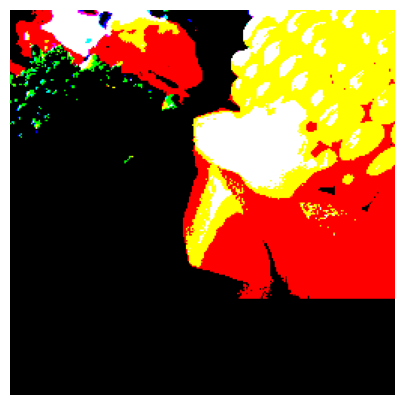

In [59]:
file = train_target.iloc[id_img]
image_data = image_to_tensor(src_path+"train2017/"+file.file_name)
image_data, bboxs, _ = preprocess_image_loc(image_data, w=img_shape, h=img_shape, bbox=tf.convert_to_tensor(file.bbox))
class_ids = tf.convert_to_tensor(file.category_name)
image_preprocessed, offsets_labels = preprocess_data_loc(image_data*255, bboxs, class_ids)

img_ = np.copy(image_data)
i=0
for bbox, category_name in zip(bboxs, file.category_name):
    img_ = add_bbox(img_, bbox.numpy(), category_name+str(i), fontScale=0.3, lw=1)
    i += 1

plt.figure(figsize=(w_disp, h_disp))
plt.imshow(image_preprocessed)
plt.axis("off")
plt.show()

### Funcion de compensación

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


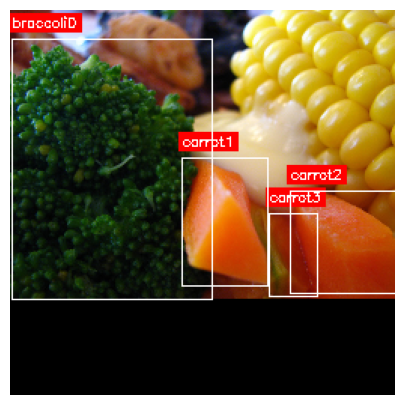

In [60]:
def displace_anchors(anchor_in_center, anchor_deltas):
    dx, dy, dw, dh = (anchor_deltas[..., 0],
                      anchor_deltas[..., 1],
                      anchor_deltas[..., 2],
                      anchor_deltas[..., 3])
    
    anchor_x, anchor_y, anchor_w, anchor_h = (anchor_in_center[..., 0],
                                              anchor_in_center[..., 1],
                                              anchor_in_center[..., 2],
                                              anchor_in_center[..., 3])
    
    center_x = dx * anchor_w + anchor_x 
    center_y = dy * anchor_h + anchor_y
    width = tf.math.exp(dw) * anchor_w
    height = tf.math.exp(dh) * anchor_h
    
    return tf.stack([center_x, center_y, width, height], axis=1)

idx_1 = tf.where(labels == 1)
anchor_list_center = tf.gather_nd(corner2center(anchor_list), idx_1)
offset_anchor = tf.gather_nd(offsets, idx_1)

_img_ = np.copy(img_)

i=0
for bbox, category_name in zip(bboxs, file.category_name):
    _img_ = add_bbox(_img_, bbox.numpy()*img_shape, category_name+str(i), fontScale=0.3, lw=1)
    i += 1

for i in center2corner(displace_anchors(anchor_list_center, offset_anchor)):
    x0 = int(i[0])
    y0 = int(i[1])
    x1 = int(i[2])
    y1 = int(i[3])
    cv2.rectangle(_img_, (x0, y0), (x1, y1), color=(255, 255, 255), thickness=1)
    
plt.figure(figsize=(w_disp, h_disp))
plt.imshow(_img_[...,::-1])
plt.axis("off")
plt.show()

### Predicciónes

In [61]:
anchor_deltas, objectiveness_score = RPN.predict(tf.expand_dims(image_preprocessed, axis=0))
anchor_deltas = anchor_deltas.reshape(len(anchor_list), 4)
objectiveness_score = objectiveness_score.reshape(len(anchor_list))
anchor_deltas, objectiveness_score

1/1 [==============================] - 1s 1s/step


(array([[ 0.00927979,  0.01600169,  0.04903305, -0.19918579],
        [ 0.00773992,  0.00362146,  0.03039793, -0.02420923],
        [ 0.01922609,  0.01510566, -0.15603891,  0.00063496],
        ...,
        [-0.00253111, -0.00902289,  0.14049488, -0.22065656],
        [ 0.0044749 , -0.00240038, -0.03259166, -0.06399566],
        [ 0.00207491,  0.00248563, -0.19500305,  0.10723925]],
       dtype=float32),
 array([0.14648911, 0.19891909, 0.20108557, ..., 0.77448726, 0.8118649 ,
        0.8934988 ], dtype=float32))

### Filtrado de anchor boxes con Non-Max Supression

Debido a que nuestras predicciones arrojan multiples anchor boxes sobre un mismo objeto, el objetivo sera priorizar aquellos que mejor se acomoden a sobre los objetos, descartando el resto de anchor boxes.

In [63]:
def filter_rois(anchor_list, anchor_deltas, scores, positive_th=0.5, iou_threshold=0.3):
    positive_condition = tf.greater(scores, positive_th)
    bboxes = tf.where(tf.expand_dims(positive_condition, axis=-1), anchor_list, 0.0)
    
    rois_in_center = displace_anchors(corner2center(bboxes), anchor_deltas)
    rois_in_corner = center2corner(rois_in_center)
    #rois_in_corner  = tf.clip_by_value(rois_in_corner, clip_value_min=0, clip_value_max=256)

    rois_w , rois_h = rois_in_corner[..., 2] - rois_in_corner[..., 0], rois_in_corner[..., 3] - rois_in_corner[..., 1]
    idx_rois_min = tf.where((rois_w > 16) & (rois_h > 16))
    rois_in_corner = tf.gather_nd(rois_in_corner, idx_rois_min)
    scores = tf.gather_nd(scores, idx_rois_min)

    scores_sort = tf.expand_dims(tf.argsort(objectiveness_score, axis=-1, direction='DESCENDING'), axis=-1)
    rois_in_corner = tf.gather_nd(rois_in_corner, scores_sort)
    scores = tf.gather_nd(scores, scores_sort)

    rois_in_corner_inv = tf.gather(rois_in_corner, [1, 0, 3, 2], axis=1)
    selected_indices, selected_scores = tf.image.non_max_suppression_with_scores(rois_in_corner_inv, scores, tf.shape(bboxes)[0], iou_threshold=iou_threshold, score_threshold=0.1, soft_nms_sigma=0.5)#tf.image.non_max_suppression(rois_in_corner_inv, scores, tf.shape(bboxes)[0], iou_threshold=iou_threshold)
    rois = tf.gather(rois_in_corner, selected_indices)

    return rois, selected_scores

rois_in_corner, objectiveness_score_ = filter_rois(anchor_list, anchor_deltas, objectiveness_score, positive_th=0.5, iou_threshold=0.7)

### Visualización

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


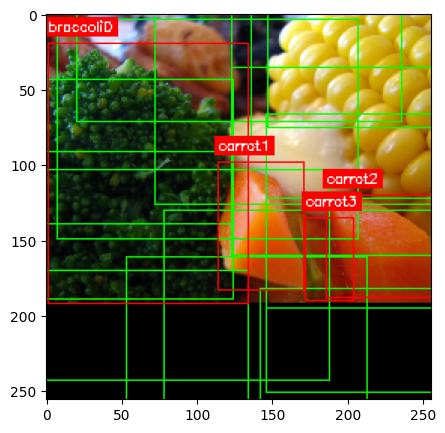

In [64]:
_img_ = np.copy(img_)
for i in rois_in_corner[0:15]: 
    x_min = int(i[0])
    y_min = int(i[1])
    x_max = int(i[2])
    y_max = int(i[3])
    cv2.rectangle(_img_, (x_min, y_min), (x_max, y_max), color=(0, 255, 0), thickness=1) 

i=0
for bbox, category_name in zip(bboxs, file.category_name):
    _img_ = add_bbox(_img_, bbox.numpy(), category_name+str(i), fontScale=0.3, lw=1)
    i += 1    

plt.figure(figsize=(w_disp, h_disp))
plt.imshow(_img_[...,::-1])
plt.show()

Debido a algunos inconvenientes durante la realizacion de este notebook no he podido continuar investigando sobre esta arquitectura, tampoco he podido encontrar el problema sobre lo desarrollado en esta sección, aparentemente las regiones propuestas no son correctas debido a que el modelo esta fallando en la clasificacion de los mismos, se ha intentado diversos cambios sobre el algoritmo pero no se ha podido conseguir los resultados deseados, el escaso poder de computo de mi sistema local no me permite explorar otras alternativas en un corto lapso de tiempo, se desea en el futuro continuar con esta investigación con el objetivo de mejorar las predicciones.

# Localizador (Desarrollo propio)

## Pre-procesando el set de entrenamiento y validación

In [40]:
def normalize_bbox(bboxes, img_shape):
    return bboxes/img_shape

def denormalize_bbox(bboxes, img_shape):
    return bboxes*img_shape
    
def preprocess_data_loc(image_data, bbox, class_ids):
    image_data_, bboxs, _ = preprocess_image_loc(image_data, w=img_shape, h=img_shape, bbox=bbox)
    bboxs = normalize_bbox(bboxs, img_shape)
    image_data_ = preprocess_input(image_data_)
    return tf.cast(image_data_, dtype=tf.float32), tf.cast(bboxs[0], dtype=tf.float32)

batch_size = 8

train_dataset_loc = train_dataset.map(preprocess_data_loc, num_parallel_calls=autotune)
train_dataset_loc = train_dataset_loc.batch(batch_size)
train_dataset_loc = train_dataset_loc.shuffle(8*batch_size, seed=seed)
train_dataset_loc = train_dataset_loc.prefetch(autotune)

val_dataset_loc = val_dataset.map(preprocess_data_loc, num_parallel_calls=autotune)
val_dataset_loc = val_dataset_loc.batch(batch_size)
val_dataset_loc = val_dataset_loc.prefetch(autotune)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


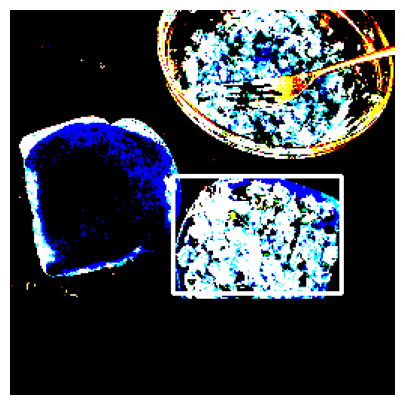

In [41]:
for data in train_dataset_loc.take(1).unbatch():
    img = np.copy(data[0])
    bbox = data[1]
    x0 = int(bbox[0]*img_shape)
    y0 = int(bbox[1]*img_shape)
    x1 = int(bbox[2]*img_shape)
    y1 = int(bbox[3]*img_shape)
    cv2.rectangle(img, (x0, y0), (x1, y1), color=(255, 255, 255), thickness=2)
    break

plt.figure(figsize=(w_disp, h_disp))
plt.imshow(img)
plt.axis("off")
plt.show()

In [27]:
def GIoULoss(gt_bboxes, pred_bboxes):
    #Referencia: https://arxiv.org/abs/1902.09630

    x1_g = gt_bboxes[..., 0]
    y1_g = gt_bboxes[..., 1]
    x2_g = gt_bboxes[..., 2]
    y2_g = gt_bboxes[..., 3]

    x1_p = tf.minimum(pred_bboxes[..., 0], pred_bboxes[..., 2])
    y1_p = tf.minimum(pred_bboxes[..., 1], pred_bboxes[..., 3])
    x2_p = tf.maximum(pred_bboxes[..., 0], pred_bboxes[..., 2])
    y2_p = tf.maximum(pred_bboxes[..., 1], pred_bboxes[..., 3])

    #Intersection
    x1_I = tf.maximum(x1_p, x1_g)
    y1_I = tf.maximum(y1_p, y1_g)
    x2_I = tf.minimum(x2_p, x2_g)
    y2_I = tf.minimum(y2_p, y2_g)
    intersections = tf.maximum((x2_I-x1_I)*(y2_I-y1_I), 0)
    
    #Union
    A_p = (x2_p-x1_p) * (y2_p-y1_p)
    A_g = (x2_g-x1_g) * (y2_g-y1_g)
    unions = A_p + A_g - intersections
    iou = intersections / unions

    x1_c = tf.minimum(x1_p, x1_g)
    y1_c = tf.minimum(y1_p, y1_g)
    x2_c = tf.maximum(x2_p, x2_g)
    y2_c = tf.maximum(y2_p, y2_g)

    A_c = (x2_c - x1_c) * (y2_c - y1_c)

    giou = iou-((A_c-unions)/A_c)

    return K.mean(1. - giou)

## Arquitectura y entrenamiento del modelo

In [50]:
backbone_loc = ResNet50(input_shape=(img_shape, img_shape, 3), include_top=False)
backbone_loc.trainable = False

model_loc = Sequential(layers=[
    Input(shape=(None, None, 3)),
    
    backbone_loc,

    GlobalAveragePooling2D(),

    Dense(1024, activation="relu"),
    Dropout(0.5),
    Dense(256, activation="relu"),
    Dropout(0.5),
    Dense(64, activation="relu"),

    Dense(4, activation="linear")
])

lr_init = 1e-5

model_loc.compile(loss="mse",
                optimizer=tf.keras.optimizers.Adam(learning_rate=lr_init),
                metrics=["mae"])

### Ploteando la arquitectura

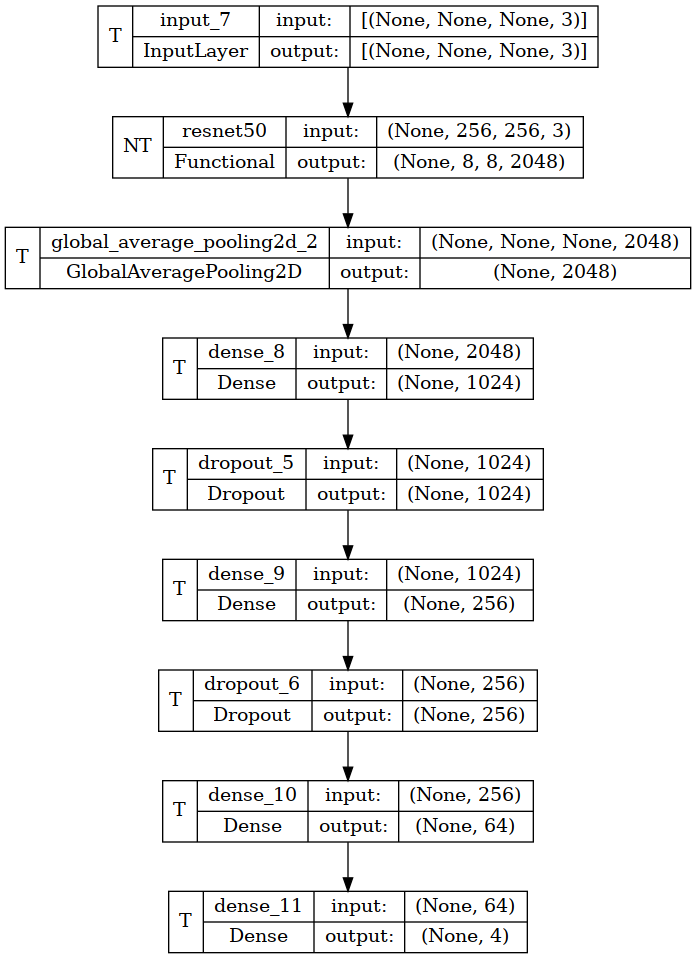

In [51]:
plot_model(model_loc, show_shapes=True, show_trainable=True)

## Entrenamiento del modelo

### Buscando el learning rate optimo

In [52]:
epochs = 15
lr_scheduler = LearningRateScheduler(lambda epoch: lr_init * 10**(epoch/5))

history_loc = model_loc.fit(train_dataset_loc.take(188), #188*8 = 1504 imagenes
                     epochs=epochs,
                     callbacks=[lr_scheduler],
                     verbose=1)

Epoch 1/15
    188/Unknown - 26s 97ms/step - loss: 0.6465 - mae: 0.6097

2024-03-01 23:46:52.826886: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 9878622795223293781

2024-03-01 23:46:52.826956: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 2707382075400872357

2024-03-01 23:46:52.826965: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 5159490511103073833

2024-03-01 23:46:52.826970: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 11154328208108471731

2024-03-01 23:46:52.826975: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 12963882840673748679

2024-03-01 23:46:52.826979: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 14789382387190180083

2024-03-01 23:46:52.826984: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous

188/188 [==============================] - 26s 99ms/step - loss: 0.6465 - mae: 0.6097 - lr: 5.0000e-05

Epoch 2/15

188/188 [==============================] - 19s 96ms/step - loss: 0.2271 - mae: 0.3734 - lr: 7.9245e-05

Epoch 3/15

188/188 [==============================] - 19s 97ms/step - loss: 0.1453 - mae: 0.3014 - lr: 1.2559e-04

Epoch 4/15

188/188 [==============================] - 19s 97ms/step - loss: 0.1045 - mae: 0.2568 - lr: 1.9905e-04

Epoch 5/15

188/188 [==============================] - 19s 98ms/step - loss: 0.0850 - mae: 0.2320 - lr: 3.1548e-04

Epoch 6/15

188/188 [==============================] - 19s 98ms/step - loss: 0.0734 - mae: 0.2155 - lr: 5.0000e-04

Epoch 7/15

188/188 [==============================] - 19s 97ms/step - loss: 0.0618 - mae: 0.1978 - lr: 7.9245e-04

Epoch 8/15

188/188 [==============================] - 19s 98ms/step - loss: 0.0590 - mae: 0.1930 - lr: 0.0013

Epoch 9/15

188/188 [==============================] - 19s 98ms/step - loss: 0.0498 - ma

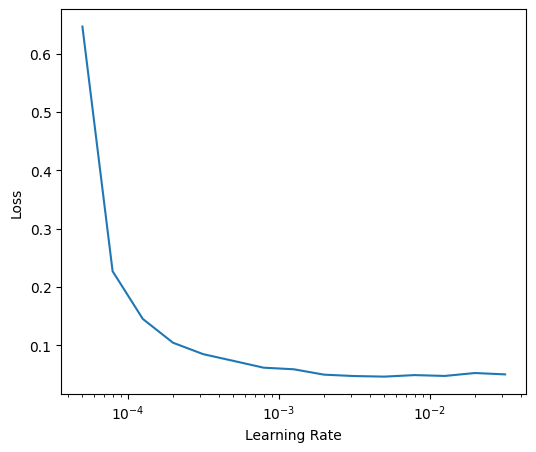

In [53]:
lrs = lr_init * (10**(np.arange(epochs)/5))
plt.figure(figsize=(w_disp, h_disp))
plt.semilogx(lrs, history_loc.history['loss'])
plt.xlabel('Learning Rate')
plt.ylabel('Loss');

### Entrenamiento

In [55]:
backbone_loc = ResNet50(input_shape=(img_shape, img_shape, 3), include_top=False)
backbone_loc.trainable = False

model_loc = Sequential(layers=[
    Input(shape=(None, None, 3)),
    backbone_loc,

    GlobalAveragePooling2D(),

    Dense(1024, activation="relu"),
    Dropout(0.5),
    Dense(256, activation="relu"),
    Dropout(0.5),
    Dense(64, activation="relu"),

    Dense(4, activation="linear")
])

model_loc.compile(loss="mse",
                optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
                metrics=["mae"])

early_stop = EarlyStopping(monitor='val_loss', patience = 3)
epochs = 25

load_model_loc = False
if load_model_loc == True:
    model_loc = tf.keras.models.load_model(dst_path+'model_loc.keras')

history_loc = model_loc.fit(
                        train_dataset_loc.take(375),
                        validation_data=val_dataset_loc,
                        epochs=epochs,
                        callbacks=[early_stop],
                        verbose=1)

model_loc.save(dst_path+'model_loc.keras')

Epoch 1/25

    375/Unknown - 40s 98ms/step - loss: 0.2481 - mae: 0.3232

2024-03-01 23:54:00.398338: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 1774374486774273052

2024-03-01 23:54:00.398409: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 5579374742321664974

2024-03-01 23:54:00.398445: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 12266588802621109436

2024-03-01 23:54:00.398463: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 8823019846929558986

2024-03-01 23:54:00.398470: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 6345017704940322520

2024-03-01 23:54:00.398475: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 1207602838164148325

2024-03-01 23:54:00.398479: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous r

375/375 [==============================] - 51s 129ms/step - loss: 0.2481 - mae: 0.3232 - val_loss: 0.0696 - val_mae: 0.2111

Epoch 2/25

375/375 [==============================] - 46s 121ms/step - loss: 0.0568 - mae: 0.1909 - val_loss: 0.0559 - val_mae: 0.1882

Epoch 3/25

375/375 [==============================] - 46s 121ms/step - loss: 0.0452 - mae: 0.1711 - val_loss: 0.0413 - val_mae: 0.1631

Epoch 4/25

375/375 [==============================] - 45s 120ms/step - loss: 0.0412 - mae: 0.1631 - val_loss: 0.0364 - val_mae: 0.1543

Epoch 5/25

375/375 [==============================] - 45s 119ms/step - loss: 0.0381 - mae: 0.1570 - val_loss: 0.0339 - val_mae: 0.1469

Epoch 6/25

375/375 [==============================] - 45s 119ms/step - loss: 0.0366 - mae: 0.1535 - val_loss: 0.0322 - val_mae: 0.1434

Epoch 7/25

375/375 [==============================] - 46s 121ms/step - loss: 0.0361 - mae: 0.1520 - val_loss: 0.0343 - val_mae: 0.1494

Epoch 8/25

375/375 [==============================] 

### Visualizando la performance del modelo durante el entrenamiento

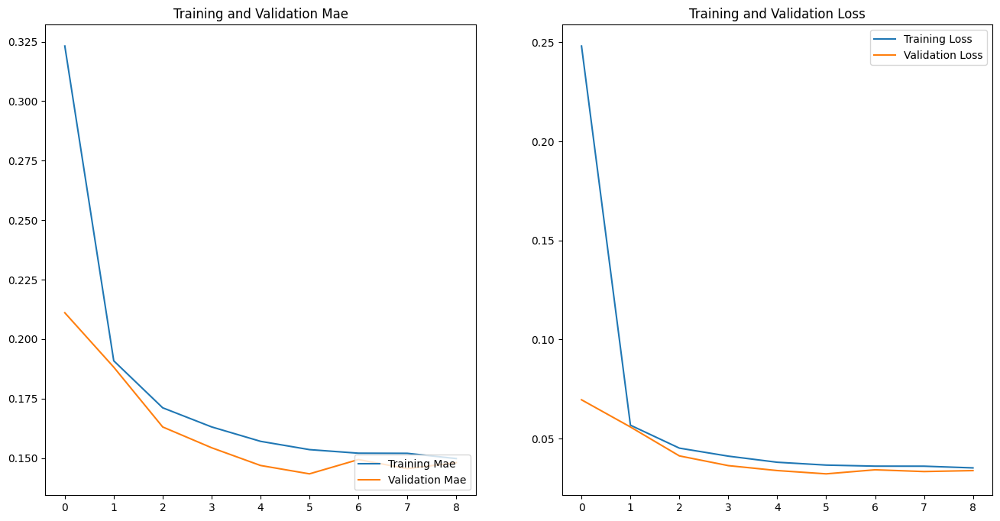

In [56]:
plot_history(history_loc, metric="mae")

In [57]:
loss_loc, acc_loc = model_loc.evaluate(val_dataset_loc)
print(f"Performance sobre el set de validación\nLoss: {loss_loc}, Accuracy: {acc_loc}")

89/89 [==============================] - 9s 94ms/step - loss: 0.0339 - mae: 0.1481

Performance sobre el set de validación

Loss: 0.03386741131544113, Accuracy: 0.14807434380054474


2024-03-02 00:01:29.627058: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 3264866499542462548

2024-03-02 00:01:29.627132: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 5335866727696081452

2024-03-02 00:01:29.627170: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 5579374742321664974

2024-03-02 00:01:29.627224: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 1774374486774273052

2024-03-02 00:01:29.627280: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 5212251406384862054

2024-03-02 00:01:29.627337: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 10776869617594910472

2024-03-02 00:01:29.627405: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous r

## Visualizando predicciones

1/1 [==============================] - 0s 26ms/step

1/1 [==============================] - 0s 21ms/step

1/1 [==============================] - 0s 19ms/step

1/1 [==============================] - 0s 18ms/step

1/1 [==============================] - 0s 19ms/step

1/1 [==============================] - 0s 21ms/step


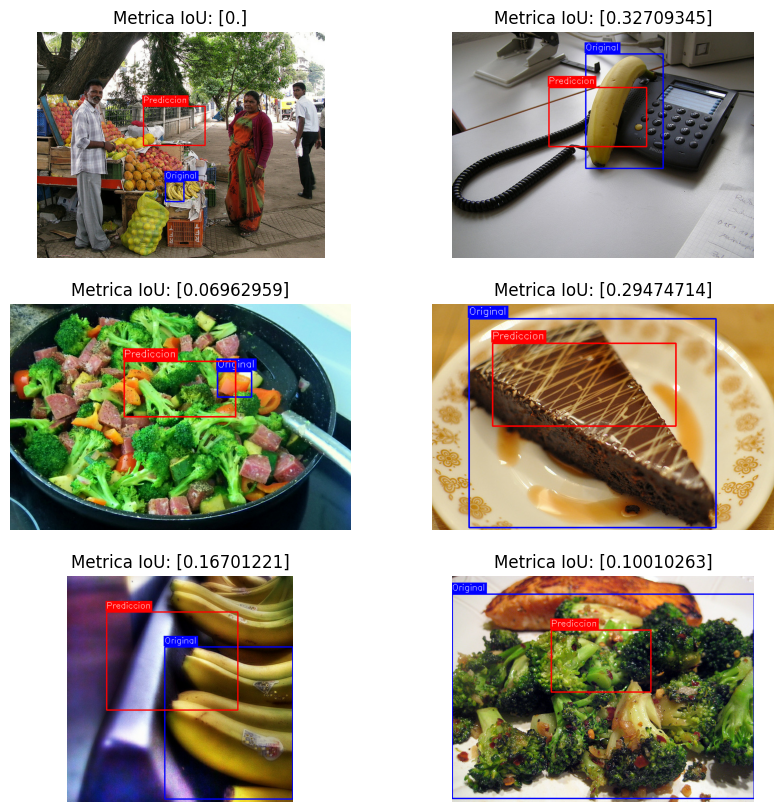

In [71]:
fig, axs = plt.subplots(3, 2, figsize=(10, 10))

for i, data in enumerate(val_dataset.shuffle(100).take(6)):
    img_pre = preprocess_image_clf(data[0], w=img_shape, h=img_shape)
    img_pre = tf.keras.applications.resnet50.preprocess_input(img_pre)
    image_shape = tf.shape(data[0]).numpy()

    predict_bbox_ = model_loc.predict(tf.expand_dims(img_pre, axis=0))[0]
    predict_bbox = np.array([[predict_bbox_[0]*image_shape[1], predict_bbox_[1]*image_shape[0], predict_bbox_[2]*image_shape[1], predict_bbox_[3]*image_shape[0]]])
    
    iou_value = iou(predict_bbox, tf.cast(data[1][0], dtype=tf.float32))

    img = add_bbox(data[0].numpy(), data[1][0].numpy(), category_name="Original", color=(0, 0, 255), lw=2)
    img = add_bbox(img, predict_bbox[0], category_name="Prediccion", color=(255, 0, 0), lw=2)

    plt.subplot(3, 2, i+1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Metrica IoU: {iou_value.numpy()[0]}")

# Clasificador y localizador
## Pre-procesando el set de entrenamiento y validación

In [76]:
img_shape = 256
classes_ids = tf.cast([train_cat.loc[train_cat.name == x, "id"].values[0] for x in targets], tf.float32)
classes_ids

<tf.Tensor: shape=(10,), dtype=float32, numpy=array([52., 53., 54., 55., 56., 57., 58., 59., 60., 61.], dtype=float32)>

In [77]:
def preprocess_data_all(image_data, bbox, class_ids):
    image_data_, bboxs, _ = preprocess_image_loc(image_data, w=img_shape, h=img_shape, bbox=bbox)
    image_data_ = preprocess_input(image_data_)

    bboxs = normalize_bbox(bboxs, img_shape)
    
    class_ids_ = transform_classes(class_ids[0:1])
    class_ids_ = tf.reduce_max(tf.one_hot(class_ids_, depth=num_classes), axis=0)
    class_ids_ = tf.reshape(class_ids_, [num_classes])

    return tf.cast(image_data_, dtype=tf.float32), {"localizador":tf.cast(bboxs[0], dtype=tf.float32), "clasificador":tf.cast(class_ids_, dtype="int8")}
        
num_classes = 10
batch_size = 8

train_dataset_all = train_dataset.map(preprocess_data_all, num_parallel_calls=autotune)
train_dataset_all = train_dataset_all.batch(batch_size)
train_dataset_all = train_dataset_all.shuffle(8*batch_size, seed=seed)
train_dataset_all = train_dataset_all.prefetch(autotune)

val_dataset_all = val_dataset.map(preprocess_data_all, num_parallel_calls=autotune)
val_dataset_all = val_dataset_all.batch(batch_size)
val_dataset_all = val_dataset_all.prefetch(autotune)

## Arquitectura del modelo

In [88]:
backbone_all = ResNet50(input_shape=(img_shape, img_shape, 3), include_top=False)

"""output_layer = 142
    i, layer in enumerate(backbone_all.layers):
    if i > output_layer:
        break
    backbone_all.layers[i].trainable = False"""

backbone_all.trainable = False

init_stage = Sequential(layers=[
    Input(shape=(None, None, 3)),

    RandomBrightness(0.2),
    RandomContrast(0.2),
    GaussianNoise(0.1),

    backbone_all
])

head_loc = Sequential(layers=[
    GlobalAveragePooling2D(),

    Dense(1024, activation="relu"),
    Dropout(0.5),
    Dense(256, activation="relu"),
    Dropout(0.5),
    Dense(64, activation="relu"),

    Dense(4, activation="linear")
], name="localizador")(init_stage.output)

head_clf = Sequential(layers=[
    MaxPooling2D(2),

    Conv2D(256, kernel_size=(3,3), activation="relu", padding="same"),
    BatchNormalization(),
    SpatialDropout2D(0.6, data_format='channels_last'),
    
    Conv2D(64, kernel_size=(3,3), activation="relu", padding="same"),
    BatchNormalization(),
    SpatialDropout2D(0.4, data_format='channels_last'),
    
    GlobalAveragePooling2D(),
    
    Dense(32, activation="relu"),
    Dropout(0.4),
    Dense(num_classes, activation="sigmoid")
], name="clasificador")(init_stage.output)

model_all = Model(inputs=[init_stage.input], outputs={'localizador':head_loc, 'clasificador':head_clf})

lr_init = 1e-4
model_all.compile(loss={'localizador':'mse', 'clasificador':BinaryCrossentropy()},
                optimizer=tf.keras.optimizers.Adam(learning_rate=lr_init),)

### Ploteando la arquitectura

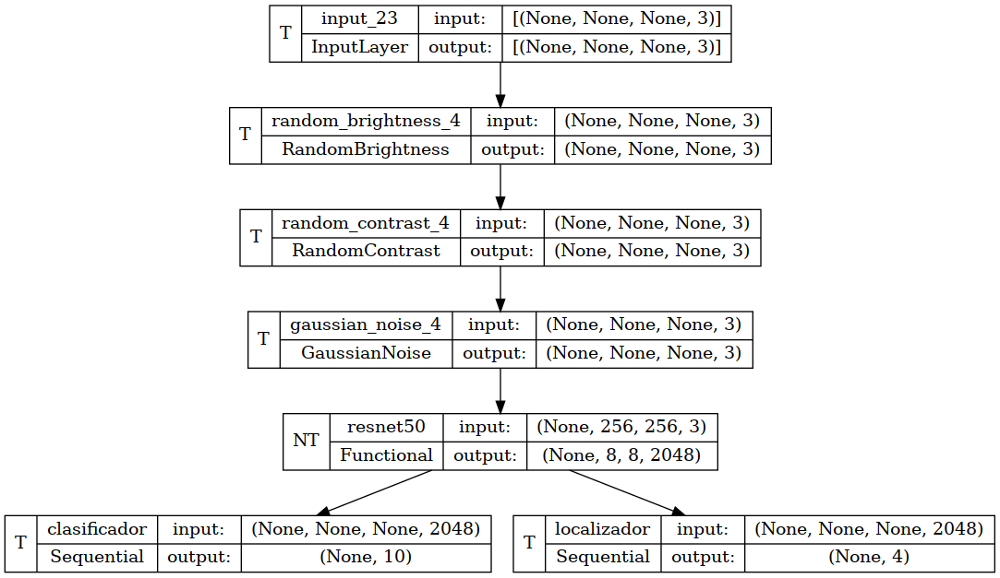

In [89]:
plot_model(model_all, show_shapes=True, show_trainable=True)

## Entrenamiento del modelo

### Buscando el learning rate optimo

In [90]:
epochs = 15
lr_scheduler = LearningRateScheduler(lambda epoch: lr_init * 10**(epoch/5))

history_all = model_all.fit(train_dataset_all.take(188), #188*8 = 1504 imagenes
                     epochs=epochs,
                     callbacks=[lr_scheduler],
                     verbose=1)

Epoch 1/15


2024-03-02 00:38:50.605620: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_23/clasificador/spatial_dropout2d_8/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


188/188 [==============================] - 28s 126ms/step - loss: 1.0477 - clasificador_loss: 0.6358 - localizador_loss: 0.4119 - lr: 1.0000e-04

Epoch 2/15


2024-03-02 00:39:15.580189: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 9831759780141723448

2024-03-02 00:39:15.580262: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 2078388904264843712

2024-03-02 00:39:15.580270: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 17831484664363590244

2024-03-02 00:39:15.580274: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 13800823206549766443

2024-03-02 00:39:15.580322: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 15264142839071735842

2024-03-02 00:39:15.580343: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 10363037091763562304

2024-03-02 00:39:15.580348: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvou

188/188 [==============================] - 24s 126ms/step - loss: 0.6666 - clasificador_loss: 0.5273 - localizador_loss: 0.1393 - lr: 1.5849e-04

Epoch 3/15

188/188 [==============================] - 24s 126ms/step - loss: 0.5306 - clasificador_loss: 0.4369 - localizador_loss: 0.0937 - lr: 2.5119e-04

Epoch 4/15

188/188 [==============================] - 24s 125ms/step - loss: 0.4437 - clasificador_loss: 0.3683 - localizador_loss: 0.0754 - lr: 3.9811e-04

Epoch 5/15

188/188 [==============================] - 24s 127ms/step - loss: 0.3946 - clasificador_loss: 0.3250 - localizador_loss: 0.0696 - lr: 6.3096e-04

Epoch 6/15

188/188 [==============================] - 24s 127ms/step - loss: 0.3589 - clasificador_loss: 0.2959 - localizador_loss: 0.0630 - lr: 0.0010

Epoch 7/15

188/188 [==============================] - 24s 126ms/step - loss: 0.3451 - clasificador_loss: 0.2890 - localizador_loss: 0.0561 - lr: 0.0016

Epoch 8/15

188/188 [==============================] - 24s 127ms/step - 

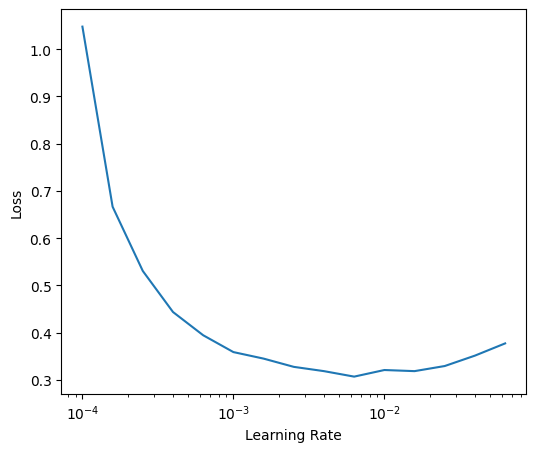

In [91]:
lrs = lr_init * (10**(np.arange(epochs)/5))
plt.figure(figsize=(w_disp, h_disp))
plt.semilogx(lrs, history_all.history['loss'])
plt.xlabel('Learning Rate')
plt.ylabel('Loss');

### Entrenamiento

In [92]:
backbone_all = ResNet50(input_shape=(img_shape, img_shape, 3), include_top=False)
backbone_all.trainable = False

init_stage = Sequential(layers=[
    Input(shape=(None, None, 3)),

    RandomBrightness(0.2),
    RandomContrast(0.2),
    GaussianNoise(0.1),

    backbone_all
])

head_loc = Sequential(layers=[
    GlobalAveragePooling2D(),

    Dense(1024, activation="relu"),
    Dropout(0.5),
    Dense(256, activation="relu"),
    Dropout(0.5),
    Dense(64, activation="relu"),

    Dense(4, activation="linear")
], name="localizador")(init_stage.output)

head_clf = Sequential(layers=[
    MaxPooling2D(2),

    Conv2D(256, kernel_size=(3,3), activation="relu", padding="same"),
    BatchNormalization(),
    SpatialDropout2D(0.6, data_format='channels_last'),
    
    Conv2D(64, kernel_size=(3,3), activation="relu", padding="same"),
    BatchNormalization(),
    SpatialDropout2D(0.4, data_format='channels_last'),
    
    GlobalAveragePooling2D(),
    
    Dense(32, activation="relu"),
    Dropout(0.4),
    Dense(num_classes, activation="sigmoid")
], name="clasificador")(init_stage.output)

model_all = Model(inputs=[init_stage.input], outputs={'localizador':head_loc, 'clasificador':head_clf})

model_all.compile(loss={'localizador':'mse', 'clasificador':BinaryCrossentropy()},
                optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
                metrics={'localizador':'mae', 'clasificador':'accuracy'})

early_stop = EarlyStopping(monitor = 'val_loss', patience = 5)
epochs = 40

load_model_all = False
if load_model_all == True:
    model_all = tf.keras.models.load_model(dst_path+'model_all.keras')

history_all = model_all.fit(
                    train_dataset_all,
                    validation_data=val_dataset_all,
                    epochs=epochs,
                    callbacks=[early_stop],
                    verbose=1)

model_all.save(dst_path+'model_all.keras')

Epoch 1/40


2024-03-02 00:46:00.717052: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_24/clasificador/spatial_dropout2d_10/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


   1974/Unknown - 253s 126ms/step - loss: 0.3889 - clasificador_loss: 0.3058 - localizador_loss: 0.0831 - clasificador_accuracy: 0.3513 - localizador_mae: 0.2029

2024-03-02 00:50:12.178041: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.11GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.

2024-03-02 00:50:12.249622: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.19GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


   2032/Unknown - 261s 127ms/step - loss: 0.3869 - clasificador_loss: 0.3052 - localizador_loss: 0.0818 - clasificador_accuracy: 0.3518 - localizador_mae: 0.2016

2024-03-02 00:50:19.606931: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 12467367023664549936

2024-03-02 00:50:19.606990: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 3814798184179532420

2024-03-02 00:50:19.607001: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 8877544452700216782

2024-03-02 00:50:19.607008: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 1402692393866577020

2024-03-02 00:50:19.607014: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 10428255815857946568

2024-03-02 00:50:19.607019: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 624671238720568810

2024-03-02 00:50:19.607026: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous r

2032/2032 [==============================] - 271s 132ms/step - loss: 0.3869 - clasificador_loss: 0.3052 - localizador_loss: 0.0818 - clasificador_accuracy: 0.3518 - localizador_mae: 0.2016 - val_loss: 0.2448 - val_clasificador_loss: 0.2062 - val_localizador_loss: 0.0385 - val_clasificador_accuracy: 0.5367 - val_localizador_mae: 0.1593

Epoch 2/40


2024-03-02 00:50:29.660041: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 9816015296048029658

2024-03-02 00:50:29.660096: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 884050231492993406

2024-03-02 00:50:29.660115: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 12182615870470552939

2024-03-02 00:50:29.660181: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 7644561322009248890

2024-03-02 00:50:29.660189: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 16715547684373406147

2024-03-02 00:50:29.660230: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 2417675954424595808

2024-03-02 00:50:29.660277: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous r

2032/2032 [==============================] - 268s 132ms/step - loss: 0.2967 - clasificador_loss: 0.2584 - localizador_loss: 0.0383 - clasificador_accuracy: 0.4369 - localizador_mae: 0.1576 - val_loss: 0.2295 - val_clasificador_loss: 0.1943 - val_localizador_loss: 0.0352 - val_clasificador_accuracy: 0.5960 - val_localizador_mae: 0.1521

Epoch 3/40

2032/2032 [==============================] - 267s 131ms/step - loss: 0.2845 - clasificador_loss: 0.2481 - localizador_loss: 0.0364 - clasificador_accuracy: 0.4590 - localizador_mae: 0.1531 - val_loss: 0.2291 - val_clasificador_loss: 0.1954 - val_localizador_loss: 0.0337 - val_clasificador_accuracy: 0.5664 - val_localizador_mae: 0.1487

Epoch 4/40

2032/2032 [==============================] - 267s 131ms/step - loss: 0.2770 - clasificador_loss: 0.2414 - localizador_loss: 0.0355 - clasificador_accuracy: 0.4743 - localizador_mae: 0.1512 - val_loss: 0.2171 - val_clasificador_loss: 0.1842 - val_localizador_loss: 0.0329 - val_clasificador_accuracy: 

2024-03-02 01:08:33.479758: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:422] ShuffleDatasetV3:1518: Filling up shuffle buffer (this may take a while): 50 of 64

2024-03-02 01:08:35.021965: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:452] Shuffle buffer filled.


2032/2032 [==============================] - 279s 132ms/step - loss: 0.2670 - clasificador_loss: 0.2323 - localizador_loss: 0.0347 - clasificador_accuracy: 0.4939 - localizador_mae: 0.1490 - val_loss: 0.2145 - val_clasificador_loss: 0.1817 - val_localizador_loss: 0.0328 - val_clasificador_accuracy: 0.5918 - val_localizador_mae: 0.1459

Epoch 7/40

2032/2032 [==============================] - 269s 132ms/step - loss: 0.2606 - clasificador_loss: 0.2265 - localizador_loss: 0.0341 - clasificador_accuracy: 0.5109 - localizador_mae: 0.1475 - val_loss: 0.2203 - val_clasificador_loss: 0.1872 - val_localizador_loss: 0.0331 - val_clasificador_accuracy: 0.5763 - val_localizador_mae: 0.1471

Epoch 8/40

2032/2032 [==============================] - 267s 131ms/step - loss: 0.2574 - clasificador_loss: 0.2233 - localizador_loss: 0.0340 - clasificador_accuracy: 0.5118 - localizador_mae: 0.1472 - val_loss: 0.2156 - val_clasificador_loss: 0.1835 - val_localizador_loss: 0.0321 - val_clasificador_accuracy: 

### Visualizando la performance del modelo durante el entrenamiento

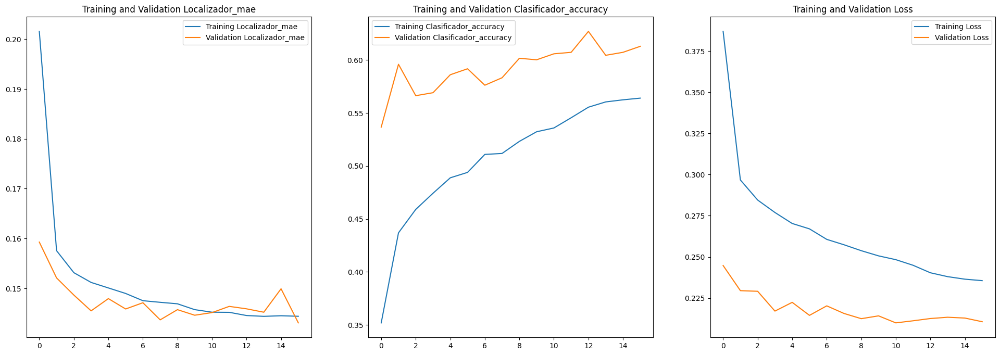

In [116]:
plot_history(history_all, metrics=["localizador_mae", "clasificador_accuracy"])

In [120]:
loss, clf_loss, loc_loss, clf_acc, loc_mae = model_all.evaluate(val_dataset_all, verbose=0)
print(f"Performance sobre el set de validación\nLoss: {loss}\nClasificador Loss: {clf_loss}\nLocalizador Loss: {loc_loss}\nClasificador Accuracy: {clf_acc}\nLocalizador MAE: {loc_mae}")

Performance sobre el set de validación

Loss: 0.2106410264968872

Clasificador Loss: 0.1789897382259369

Localizador Loss: 0.031651295721530914

Clasificador Accuracy: 0.612994372844696

Localizador MAE: 0.14307230710983276


2024-03-02 12:41:15.765408: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 9816015296048029658

2024-03-02 12:41:15.765481: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 7709582916551455041

2024-03-02 12:41:15.765551: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 13056205886134133599

2024-03-02 12:41:15.765581: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 13896175570714113115

2024-03-02 12:41:15.765611: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 17275618431814608409

2024-03-02 12:41:15.765623: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 884050231492993406

2024-03-02 12:41:15.765647: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous 

## Visualizando predicciones

1/1 [==============================] - 0s 18ms/step

1/1 [==============================] - 0s 24ms/step

1/1 [==============================] - 0s 20ms/step

1/1 [==============================] - 0s 18ms/step

1/1 [==============================] - 0s 18ms/step

1/1 [==============================] - 0s 19ms/step

1/1 [==============================] - 0s 19ms/step

1/1 [==============================] - 0s 21ms/step

1/1 [==============================] - 0s 20ms/step


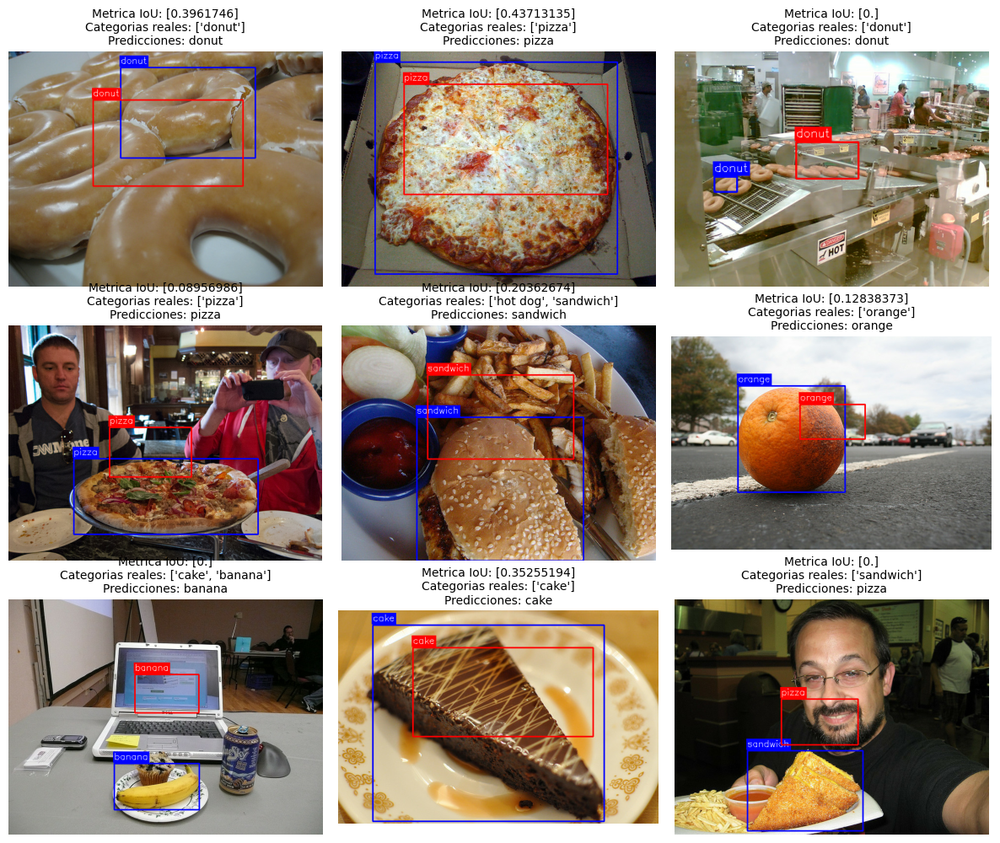

In [103]:
fig, axs = plt.subplots(3, 3, figsize=(12, 10))

for i, data in enumerate(val_dataset.shuffle(100).take(9)):
    img_pre = preprocess_image_clf(data[0], w=img_shape, h=img_shape)
    img_pre = tf.keras.applications.resnet50.preprocess_input(img_pre)
    image_shape = tf.shape(data[0]).numpy()

    prediction = model_all.predict(tf.expand_dims(img_pre, axis=0))
    
    predict_bbox_, predict_class = prediction["localizador"][0], prediction["clasificador"][0]
    predict_bbox = np.array([[predict_bbox_[0]*image_shape[1], predict_bbox_[1]*image_shape[0], predict_bbox_[2]*image_shape[1], predict_bbox_[3]*image_shape[0]]])
    
    predict_bool = (predict_class > .5)
    class_ids = list(get_class_ids().keys())
    classes = []
    classes_reales = []
    
    for k, x in enumerate(predict_bool):
        if bool(x) is True:
            classes.append(class_ids[k])
            
    for x in data[2].numpy():
            classes_reales.append(class_ids[get_class_ids(x)])
    
    classes = '' if len(classes) == 0 else classes[0]
    
    iou_value = iou(predict_bbox, tf.cast(data[1][0], dtype=tf.float32))

    img = add_bbox(data[0].numpy(), data[1][0].numpy(), category_name=classes_reales[0], color=(0, 0, 255), lw=2)
    img = add_bbox(img, predict_bbox[0], category_name=classes, color=(255, 0, 0), lw=2)

    plt.subplot(3, 3, i+1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Metrica IoU: {iou_value.numpy()[0]}\nCategorias reales: {list(set(classes_reales))}\nPredicciones: {classes}", fontsize=10)
plt.tight_layout()